# Sugestões de Rotas ciclicas para Transporte de Ônibus Urbano

In [29]:
from _thread import *
from IPython.display import IFrame

import random
import threading
import osmnx as ox
import networkx as nx
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import time

import warnings
warnings.filterwarnings("ignore")

# Configuração para o algoritmo genético

In [30]:
totGeracoes  = 500
tamPopulacao = 50


indCruzamento = 5
CXPB = 0.5
MUTPB = 0.15
PROB_MUTACAO = 0.15

#pontuação baixo será eliminada do grafo
removerPior = 0

#fornecer ajuda para a evolucao do método
recebeAjuda  = False
ajudaQtd = 100

#Reforço no aprendizado
reforco = False

# Ajuste de 1.0 -> maximização ou -1.0 -> minimização da feature
feature1 = 1.0 #onemax
feature2 = 1.0 #dfs
feature3 = 1.0 #distancia dfs
feature4 = 1.0 #tam ciclo
feature5 = 1.0 #distancia ciclo

# Formato Imagens

In [31]:
'''
    Formatos Suportados salvar rotas e mapas: eps, pdf, pgf, png, ps, raw, rgba, svg, svgz 
'''
formato_imgs = 'pdf'

# Configuração da Imagens

In [32]:
'''
    configuração da imagens
'''
edge_color = "#000000"     # cor da aresta
bgcolor    = "#D3D3D3"     # cor do background
node_color = "#9370DB"     # cor da vértice
node_size  = 10            # Tamanho do vértice
fig_height = 20           # altura figura
fig_width  = 20           # largura figura

# Localização para o OSMNX gerar o Grafo

In [33]:
try:
    place = 'Boa Vista, Roraima, BR'
    Raio_distancia = 15000

    G = ox.graph_from_address( place, network_type='drive', simplify=True, distance=Raio_distancia )
except:
    print("Falha na Conexão!!")

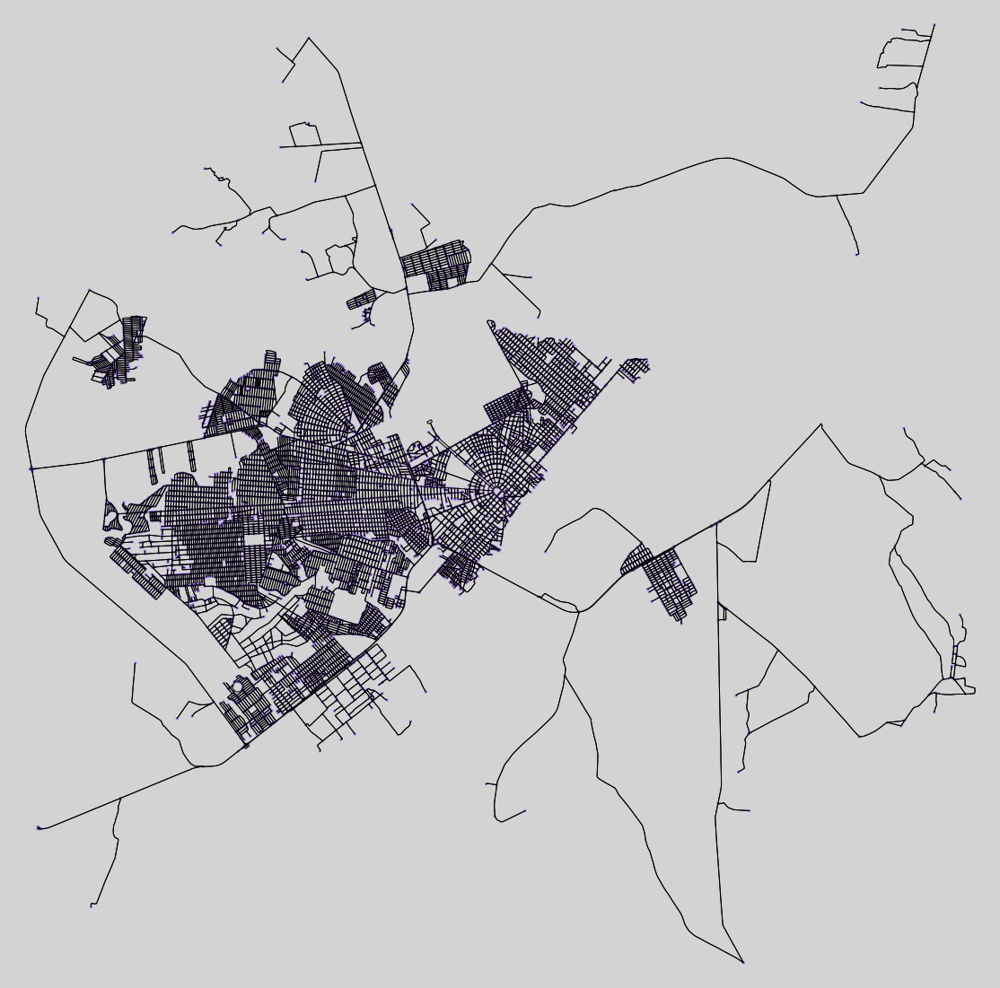

(<Figure size 1440x1440 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f4e73dfa208>)

In [34]:
ox.plot_graph(G, fig_height=fig_height, fig_width=fig_width, edge_color=edge_color, bgcolor=bgcolor, node_color=node_color, node_size=node_size, filename="mapaCompleto", save=True, file_format=formato_imgs)

# Vértice que representa o terminal de ônibus

In [35]:
nodosCentroCivico = (3648084763,3648084762)
nodoAdjTerminal   = (3648084763,3589958315)

# Extrai as informações das via do Grafo G

In [36]:
listaDados = []

dado = G.adj
for i in dado:
    for j in dado[i]:
        for k in dado[i][j]:
            h = []
            h.append(i)
            h.append(j)
            h.append(dado[i][j][k])
            listaDados.append(h)

# Gera uma lista com as pontuações que cada aresta recebeu dentre as suas características

In [37]:
listaValores = []
valorRuim = -1

for i in listaDados:
    soma = 0
    
    if "highway" in i[2]:
        if i[2]['highway'] == "primary": #ex: avenida venezuela
            soma = 1
        elif i[2]['highway'] == "secondary": #ex: Major Williams
            soma = 1
        elif i[2]['highway'] == "tertiary": #ex: Rua General Penha Brasil
            soma = 1
        else:
            soma = valorRuim
    
    
    listaValores.append(soma)


# Separa os vértices que não conseguiram atingir a pontuação mínima para remoção do Grafo

In [38]:
remover = []

for i in range(len(listaValores)):
    if listaValores[i] <= removerPior:
        remover.append( (listaDados[i][0], listaDados[i][1]))
        
G.remove_edges_from(remover)

# Atualiza a lista de arestas que estão aptas a serem selecionadas

In [39]:
listaValoresNew = []
listaDadosNew = []

for i in range(len(listaDados)):
    if listaValores[i] >= removerPior:
        listaValoresNew.append( listaValores[i] )
        listaDadosNew.append( listaDados[i] )

listaDados.clear()
listaValores.clear()
print(len(listaValoresNew))

6967


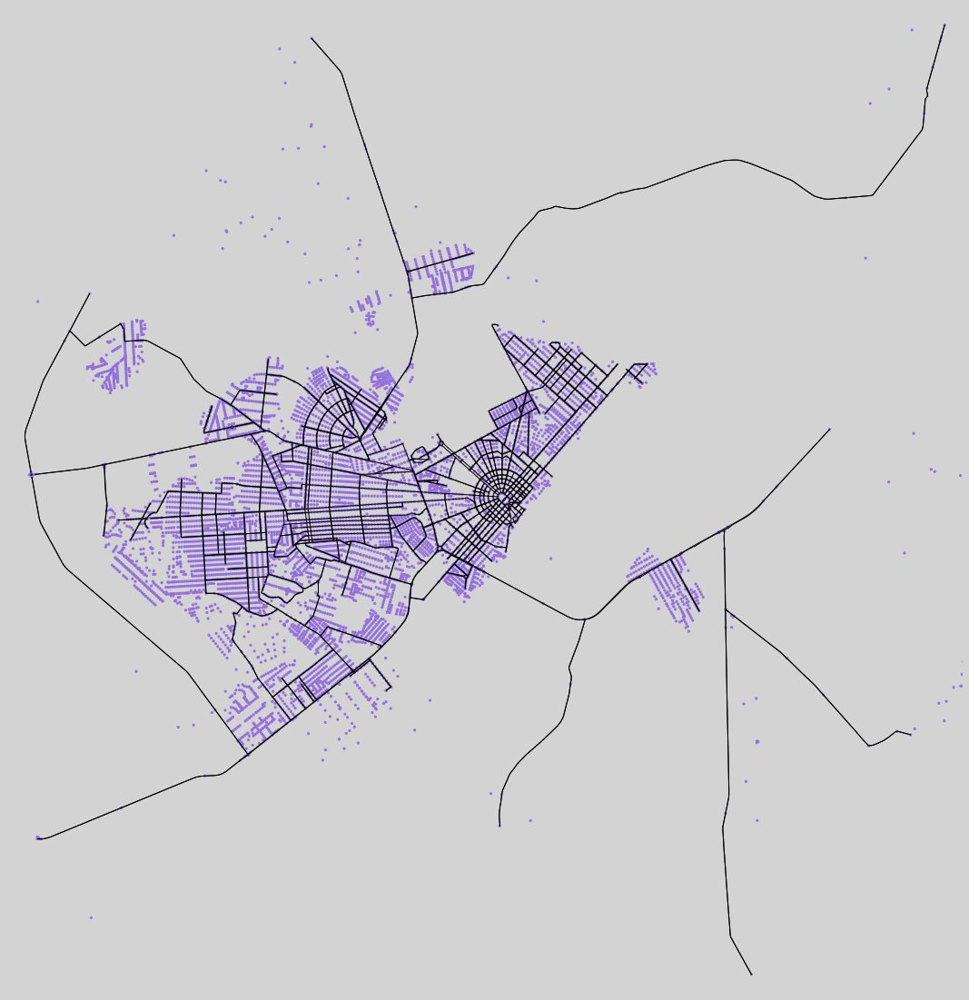

(<Figure size 1440x1440 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f4e75ed30b8>)

In [40]:
ox.plot_graph(G, fig_height=fig_height, fig_width=fig_width, edge_color=edge_color, bgcolor=bgcolor, node_color=node_color, node_size=node_size, filename="mapaFiltrado", save=True,  file_format=formato_imgs)

# Lista que receberá os caminhos encontrados pelo AG

In [41]:
listaResultadoDFS = []
tamanhoDosCiclosSalvos = []

tamGenes = len( listaDadosNew )

# Lista para salvar as informações da evolução do AG para plotagem de gráfico ao final do experimento

In [42]:
PlotMinDadosONEMAX  = []
PlotMeanDadosONEMAX = []
PlotMaxDadosONEMAX  = []

PlotMinDadosDFS  = []
PlotMeanDadosDFS = []
PlotMaxDadosDFS  = []

PlotMinDistDFS = []
PlotMeanDistDFS = []
PlotMaxDistDFS = []

PlotMinTamCiclo = []
PlotMeanTamCiclo = []
PlotMaxTamCiclo = []

PlotMinDistCiclo = []
PlotMeanDistCiclo = []
PlotMaxDistCiclo = []

PlotTempoExecucao = []

# Controle dos ciclos

In [43]:
PlotMaioresCiclos = []
PlotMaioresCiclos.append(0)

In [44]:
lenghtListaDadosnew = len(listaDadosNew)

# Reforço

In [45]:
reforco = [ 0 for _ in range(0, len(G.nodes)+1)]

# Busca em profundidade que encontrará os caminhos caso exista

In [46]:
def DFS_BuscaCiclo(grafo, mapa, mapaGrafo, verticeInicial, tamGrafo):
    
    import stack    
    pilha = stack.stack()
    v = verticeInicial
    
    #vetor de marcação de visitados e de elementos que estão na pilha O(1)
    visitados = []
    pilha_rec = []
    
    for i in range(tamGrafo):
        visitados.append(False)
        pilha_rec.append(False)
    
        
    it = -1
    contListaPercorrida = 0
    contDistPercorrida  = 0
    semDistancia = 0
    listaPercorrida = []
    controleMaiorCiclo = PlotMaioresCiclos[-1]
    
    tamanhoCicloRetorno = 0
    distanciaCicloRetorno = 0
    distanciaCicloRetorno
    
    #inicio da BFS
    while True:
        achou_vizinho = False        
        
        listaPercorrida.append(v)
        contListaPercorrida += 1
                
        if not visitados[ mapa[ v ] ]:
            x = mapa[ v ]
            
            pilha.empilhar( x )
            visitados[ x ] = True
            pilha_rec[ x ] = True
            
            
        for it in grafo[v]:
            
            #se tiver na pilha é porque possue ciclo - Achou um Ciclo          
            if it == verticeInicial:
                
                listaArestasCiclo = []
                
                for k in listaPercorrida:
                    if pilha_rec[ mapa[ k ] ] == True:
                        listaArestasCiclo.append( k )
                        
                tamList = len( listaArestasCiclo )
                
                tamanhoCicloRetorno = tamList
                distanciaCicloRetorno = contDistPercorrida
                
                '''
                    sempre salva ciclos maiores!
                '''
                if tamList > controleMaiorCiclo:
                    controleMaiorCiclo = tamList
                    
                    PlotMaioresCiclos.append( controleMaiorCiclo )
                                                        
                    '''
                        Pega o ciclo para salvar
                    '''
                    
                    cicloAtual = []
                    
                    #for k in range(1, len(listaArestasCiclo)):
                    for k in range(1, tamList):
                        cicloAtual.append( (listaArestasCiclo[k-1], listaArestasCiclo[k]) )
                    cicloAtual.append( ( listaArestasCiclo[-1], listaArestasCiclo[0] ) )
                    
                    cicloAtualList = list( cicloAtual )
                    listaResultadoDFS.append( cicloAtualList )
                    tamanhoDosCiclosSalvos.append( tamList )
                    achou_vizinho = False
                    break
                    
            if not visitados[ mapa[ it ] ]:
                achou_vizinho = True
                break
                
        if not achou_vizinho:
            pilha_rec[ pilha.topo() ] = False
                
            pilha.desempilhar()
            
            if pilha.p_vazia():
                break
                
            v = mapaGrafo[ pilha.topo() ]
        
        else:
            # -------- pegar a distancia de A -> B ---------
            # do vertice A
            verticeAtual = v
            # para o vertice B
            verticeNovo  = it
            
            
            try:

                '''
                    Pegar a distancia percorrida pela DFS..
                '''
                            
                for lista_i in range(lenghtListaDadosnew):            
                    if( listaDadosNew[lista_i][0] == verticeAtual and listaDadosNew[lista_i][1] == verticeNovo ):
                        if 'length' in listaDadosNew[lista_i][2]:
                            lenghtAresta = float(listaDadosNew[lista_i][2]['length'])
                            contDistPercorrida  = float(contDistPercorrida + lenghtAresta)
                            break
                        else:
                            semDistancia = semDistancia + 1
            except:
                print("Erro na distancia...")
            
            
            
            # ---------------------------------------------
            
            # da busca em profundidade troca o vertice para o proximo
            # ---- NAO mexer ----------
            v =  it
            # -------------------------
    
    '''
        calcular a distancia achada + a media das distancias nao achadas
    '''
    
    
    # distancia percorrida
    distanciaFinal = ( contDistPercorrida ) + ( 2 * semDistancia )
    #print("Distancia percorrida: {}".format(distanciaFinal))   
    
    '''
        Falta retornar a distancia percorrida junto com a contListaPercorrida
    '''
    
    # Retorna a quantidade de arestas visitadas na busca em profundidade
    return contListaPercorrida, distanciaFinal, tamanhoCicloRetorno, distanciaCicloRetorno 

# Função que executa um filtro para remover as arestas não selecionadas pelo AG e envia a DFS para validação de rotas

In [47]:
def temCicloDFS(individuo):
    
    G_aux = G.copy()
    
    # ajuda na evolução do onemax
    if recebeAjuda:
        for i in range(ajudaQtd):            
            posicao = random.randint(0,tamGenes-1)
            individuo[posicao] = 1
        
        
                
    #identificador da posicao do nodo centro cívico para verificar se esta ativo
    ja_1 = False
    ja_2 = False
    for i in range(tamGenes):
        if listaDadosNew[i][0] == nodosCentroCivico[0] and listaDadosNew[i][1] == nodosCentroCivico[1]:
            individuo[i] = 1
            ja_1 = True
        if listaDadosNew[i][0] == nodoAdjTerminal[0] and listaDadosNew[i][1] == nodoAdjTerminal[1]:
            individuo[i] = 0
            ja_2 = True
        if ja_1 and ja_2:
            break
            
    
    #lista para remover os nós não selecionados pelo AG
    listaRemover = []            
        
    #Seleção dos nodos não selecionados
    #for i in range(len(individuo)):
    for i in range(tamGenes):
        if individuo[i] == 0:
            listaRemover.append( (listaDadosNew[i][0], listaDadosNew[i][1]) )
            
    #Remove os nodos não selecionados pelo AG
    G_aux.remove_edges_from( listaRemover )
    
    
    
    #listaMapa recebe os valores de [0 a totNodos]
    listaMapa = []
    for i in range(len(G_aux.nodes)):
        listaMapa.append(i)
    
    
    # 215151515 --> 10
    mapa = pd.Series(index=G_aux.nodes, data=listaMapa)
    # 10 --> 215151515
    mapaGrafo = pd.Series(G_aux.nodes)
       
    return DFS_BuscaCiclo(G_aux, mapa, mapaGrafo, nodosCentroCivico[0], len(G_aux.nodes))

In [48]:
#feature 1

def calc_objetivo_1(id, l_onemax):
    minimo = int(np.min(l_onemax))
    maximo = int(np.max(l_onemax))
    media  = int(np.mean(l_onemax))
    #print("ONEMAX:\t{}\t{}\t{}".format(minimo,media , maximo))
    PlotMinDadosONEMAX.append(minimo)
    PlotMeanDadosONEMAX.append(media)
    PlotMaxDadosONEMAX.append(maximo)
        

In [49]:
#feature 2

def calc_objetivo_2(id, l_dfs):
    minimo = int(np.min(l_dfs))
    maximo = int(np.max(l_dfs))
    media  = int(np.mean(l_dfs))
    #print("DFS:\t{}\t{}\t{}".format(minimo,media , maximo))
    # Grafico
    PlotMinDadosDFS.append(minimo)
    PlotMeanDadosDFS.append(media)
    PlotMaxDadosDFS.append(maximo)
        

In [50]:
#feature 3

def calc_objetivo_3(id, l_dist):
    minimo = int(np.min(l_dist))
    maximo = int(np.max(l_dist))
    media  = int(np.mean(l_dist))
    #print("DIST:\t{}\t{}\t{}".format(minimo,media , maximo))
    # Grafico
    PlotMinDistDFS.append(minimo)
    PlotMeanDistDFS.append(media)
    PlotMaxDistDFS.append(maximo)
        

In [51]:
#feature 4

def calc_objetivo_4(id, l_tam_ciclo):
    minimo = int(np.min(l_tam_ciclo))
    maximo = int(np.max(l_tam_ciclo))
    media  = int(np.mean(l_tam_ciclo))
    #print("TamC:\t{}\t{}\t{}".format(minimo,media , maximo))
    # Grafico
    PlotMinTamCiclo.append(minimo)
    PlotMeanTamCiclo.append(media)
    PlotMaxTamCiclo.append(maximo)


In [52]:
#feature 5

def calc_objetivo_5(id, l_dist_ciclo):
    minimo = int(np.min(l_dist_ciclo))
    maximo = int(np.max(l_dist_ciclo))
    media  = int(np.mean(l_dist_ciclo))
    #print("DistRotaC:\t{}\t{}\t{}".format(minimo,media , maximo))
    # Grafico
    PlotMinDistCiclo.append(minimo)
    PlotMeanDistCiclo.append(media)
    PlotMaxDistCiclo.append(maximo)
        

In [53]:
def timeExecuteGeneration(tempoInicio):
    tempoFinal = time.time()
    tempototal = tempoFinal - tempoInicio
    PlotTempoExecucao.append(tempototal)
    print("Tempo: {}".format(tempototal))

# DEAP - ONEMAX

In [54]:
from deap import base
from deap import creator
from deap import tools
from deap import creator, base, tools, algorithms
import random

In [55]:
'''
    1) OneMax
    2) DFS
    3) Distancia percorrida DFS
    4) tamanho do ciclo
    5) distancia do trajeto da rota
'''
creator.create("FitnessMulti", base.Fitness, weights=(feature1, feature2, feature3, feature4, feature5))
creator.create("Individual", list, fitness=creator.FitnessMulti)

def evalFitness(individual):
    '''
        Retorno do método
        contListaPercorrida, distanciaFinal, tamanhoCicloRetorno, distanciaCicloRetorno
    '''
    tamDFS, distanciaDFS, tamanhoCiclo, distanciaCiclo = temCicloDFS(individual)
    return np.sum(individual), tamDFS, distanciaDFS, tamanhoCiclo, distanciaCiclo
    


toolbox = base.Toolbox()
toolbox.register("bit", random.randint, 0, 1)
toolbox.register("individual", tools.initRepeat, creator.Individual, toolbox.bit, tamGenes)
toolbox.register("population", tools.initRepeat, list, toolbox.individual, n=tamPopulacao)
toolbox.register("evaluate", evalFitness)
toolbox.register("mate", tools.cxUniform, indpb=0.1)
toolbox.register("mutate", tools.mutFlipBit, indpb=0.05)
toolbox.register("select", tools.selNSGA2)


def main():
    random.seed(64)
    population = toolbox.population()
    fits = toolbox.map(toolbox.evaluate, population)
    
    for fit, ind in zip(fits, population):
        ind.fitness.values = fit
    
    print("Start of evolution")
            
    for gen in range(totGeracoes):
        
        tempoInicio = time.time()
        
        print('GERAÇÃO: {}'.format(gen+1))
        offspring = algorithms.varOr(population, toolbox, lambda_=tamPopulacao, cxpb=0.5, mutpb=0.1)
        fits = toolbox.map(toolbox.evaluate, offspring)
        
        l_onemax = []
        l_dfs = []
        l_dist = []
        l_tam_ciclo = []
        l_dist_ciclo = []
        
        for fit, ind in zip(fits, offspring):
            ind.fitness.values = fit            
            x, y, z, w, v = fit
            l_onemax.append(x)
            l_dfs.append(y)
            l_dist.append(z)
            l_tam_ciclo.append(w)
            l_dist_ciclo.append(v)
            
        population = toolbox.select(offspring + population, k=tamPopulacao)
        
        # ONEMAX
        #calc_objetivo_1(l_onemax)        
        thread_ob_1 = threading.Thread(target=calc_objetivo_1, args=[1,l_onemax])
        thread_ob_1.start()
        
        # DFS
        #calc_objetivo_2(l_dfs)
        thread_ob_2 = threading.Thread(target=calc_objetivo_2, args=[2,l_dfs])
        thread_ob_2.start()
        
        # DISTÂNCIA
        #calc_objetivo_3(l_dist)
        thread_ob_3 = threading.Thread(target=calc_objetivo_3, args=[3,l_dist] )
        thread_ob_3.start()
        
        # Tamanho Ciclo
        #calc_objetivo_4(l_tam_ciclo)
        thread_ob_4 = threading.Thread(target=calc_objetivo_4, args=[4,l_tam_ciclo])
        thread_ob_4.start()
        
        # tamanho da rota Ciclica
        #calc_objetivo_5(l_dist_ciclo)
        thread_ob_5 = threading.Thread(target=calc_objetivo_5, args=[5,l_dist_ciclo])
        thread_ob_5.start()
        
        timeExecuteGeneration(tempoInicio)
        
    print("-- End of (successful) evolution --")
        
if __name__ == "__main__":
    main()

Start of evolution
GERAÇÃO: 1
Tempo: 6.8816306591033936
GERAÇÃO: 2
Tempo: 6.989079236984253
GERAÇÃO: 3
Tempo: 7.055514574050903
GERAÇÃO: 4
Tempo: 7.061715126037598
GERAÇÃO: 5
Tempo: 7.810714960098267
GERAÇÃO: 6
Tempo: 8.026533365249634
GERAÇÃO: 7
Tempo: 7.944715261459351
GERAÇÃO: 8
Tempo: 8.402779817581177
GERAÇÃO: 9
Tempo: 8.026398658752441
GERAÇÃO: 10
Tempo: 8.171981573104858
GERAÇÃO: 11
Tempo: 8.608884572982788
GERAÇÃO: 12
Tempo: 8.837808847427368
GERAÇÃO: 13
Tempo: 9.329594850540161
GERAÇÃO: 14
Tempo: 8.852238655090332
GERAÇÃO: 15
Tempo: 9.81010127067566
GERAÇÃO: 16
Tempo: 9.843551874160767
GERAÇÃO: 17
Tempo: 10.442731618881226
GERAÇÃO: 18
Tempo: 10.391298055648804
GERAÇÃO: 19
Tempo: 10.041484355926514
GERAÇÃO: 20
Tempo: 11.258726835250854
GERAÇÃO: 21
Tempo: 11.238691329956055
GERAÇÃO: 22
Tempo: 12.221168994903564
GERAÇÃO: 23
Tempo: 12.957037210464478
GERAÇÃO: 24
Tempo: 12.092376232147217
GERAÇÃO: 25
Tempo: 11.858309268951416
GERAÇÃO: 26
Tempo: 13.131410598754883
GERAÇÃO: 27
Tempo:

Tempo: 25.94263458251953
GERAÇÃO: 217
Tempo: 24.10897207260132
GERAÇÃO: 218
Tempo: 24.065998315811157
GERAÇÃO: 219
Tempo: 26.263129472732544
GERAÇÃO: 220
Tempo: 30.71939516067505
GERAÇÃO: 221
Tempo: 22.992797136306763
GERAÇÃO: 222
Tempo: 22.95286774635315
GERAÇÃO: 223
Tempo: 23.93994450569153
GERAÇÃO: 224
Tempo: 23.189504623413086
GERAÇÃO: 225
Tempo: 23.070992708206177
GERAÇÃO: 226
Tempo: 25.382554054260254
GERAÇÃO: 227
Tempo: 27.20976734161377
GERAÇÃO: 228
Tempo: 22.9106285572052
GERAÇÃO: 229
Tempo: 21.614333391189575
GERAÇÃO: 230
Tempo: 21.516111612319946
GERAÇÃO: 231
Tempo: 23.60300850868225
GERAÇÃO: 232
Tempo: 22.80499291419983
GERAÇÃO: 233
Tempo: 23.043462991714478
GERAÇÃO: 234
Tempo: 22.889866590499878
GERAÇÃO: 235
Tempo: 22.21053695678711
GERAÇÃO: 236
Tempo: 23.245320081710815
GERAÇÃO: 237
Tempo: 22.888502597808838
GERAÇÃO: 238
Tempo: 22.1574387550354
GERAÇÃO: 239
Tempo: 24.596601486206055
GERAÇÃO: 240
Tempo: 24.724592685699463
GERAÇÃO: 241
Tempo: 24.950889587402344
GERAÇÃO: 242

Tempo: 26.05673623085022
GERAÇÃO: 430
Tempo: 26.7029390335083
GERAÇÃO: 431
Tempo: 26.42946434020996
GERAÇÃO: 432
Tempo: 28.433416604995728
GERAÇÃO: 433
Tempo: 28.751954793930054
GERAÇÃO: 434
Tempo: 28.710501670837402
GERAÇÃO: 435
Tempo: 27.42947554588318
GERAÇÃO: 436
Tempo: 27.637940168380737
GERAÇÃO: 437
Tempo: 28.469451189041138
GERAÇÃO: 438
Tempo: 28.61393451690674
GERAÇÃO: 439
Tempo: 28.777940034866333
GERAÇÃO: 440
Tempo: 27.68219828605652
GERAÇÃO: 441
Tempo: 28.00402021408081
GERAÇÃO: 442
Tempo: 28.285235166549683
GERAÇÃO: 443
Tempo: 27.400635480880737
GERAÇÃO: 444
Tempo: 26.63060188293457
GERAÇÃO: 445
Tempo: 28.100785732269287
GERAÇÃO: 446
Tempo: 27.58037042617798
GERAÇÃO: 447
Tempo: 28.61016082763672
GERAÇÃO: 448
Tempo: 27.985642671585083
GERAÇÃO: 449
Tempo: 27.634957313537598
GERAÇÃO: 450
Tempo: 27.505670070648193
GERAÇÃO: 451
Tempo: 28.573405504226685
GERAÇÃO: 452
Tempo: 28.141479015350342
GERAÇÃO: 453
Tempo: 28.05203413963318
GERAÇÃO: 454
Tempo: 29.064188718795776
GERAÇÃO: 45

# Gráfico da Evolução do AG dentre as gerações com máximo, média e mínimo

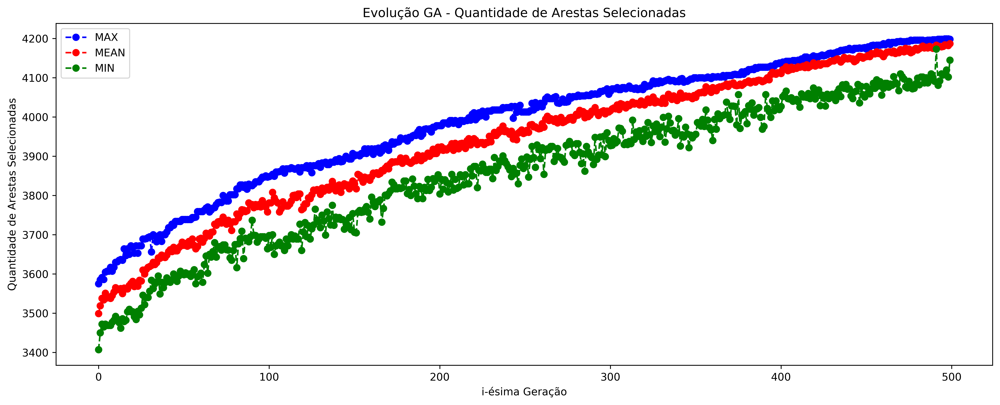

In [56]:
# obj 1
plt.figure(figsize=(16,6), dpi=600)
plt.plot(PlotMaxDadosONEMAX, 'ob--' , label='MAX')
plt.plot(PlotMeanDadosONEMAX, 'or--' ,label='MEAN')
plt.plot(PlotMinDadosONEMAX, 'og--',label='MIN')
plt.xlabel('i-ésima Geração')
plt.ylabel('Quantidade de Arestas Selecionadas')
plt.title('Evolução GA - Quantidade de Arestas Selecionadas')
plt.legend(loc='upper left')
plt.savefig("images/3-GraficoONEMAX.pdf",format=formato_imgs)
#plt.show()


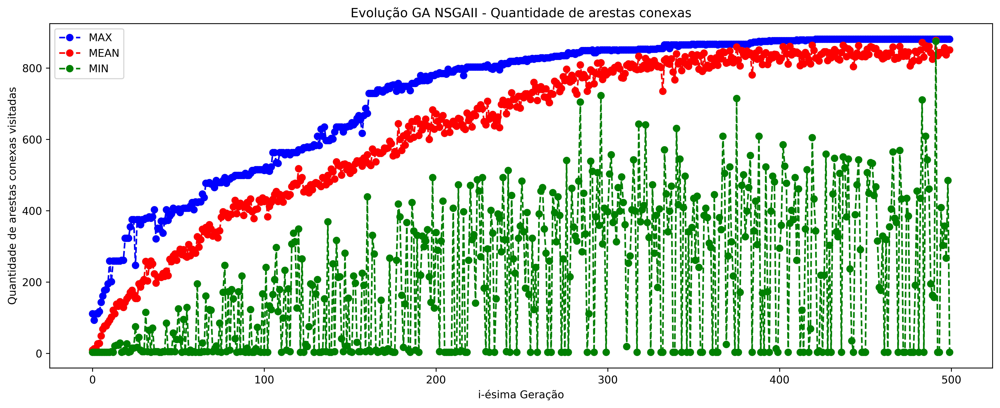

In [57]:
# obj 2
plt.figure(figsize=(16,6), dpi=600)
plt.plot(PlotMaxDadosDFS, 'ob--' , label='MAX')
plt.plot(PlotMeanDadosDFS, 'or--' ,label='MEAN')
plt.plot(PlotMinDadosDFS, 'og--',label='MIN')
plt.xlabel('i-ésima Geração')
plt.ylabel('Quantidade de arestas conexas visitadas')
plt.title('Evolução GA NSGAII - Quantidade de arestas conexas')
plt.legend(loc='upper left')
plt.savefig("images/3-GraficoDFS.pdf",format=formato_imgs)
#plt.show()


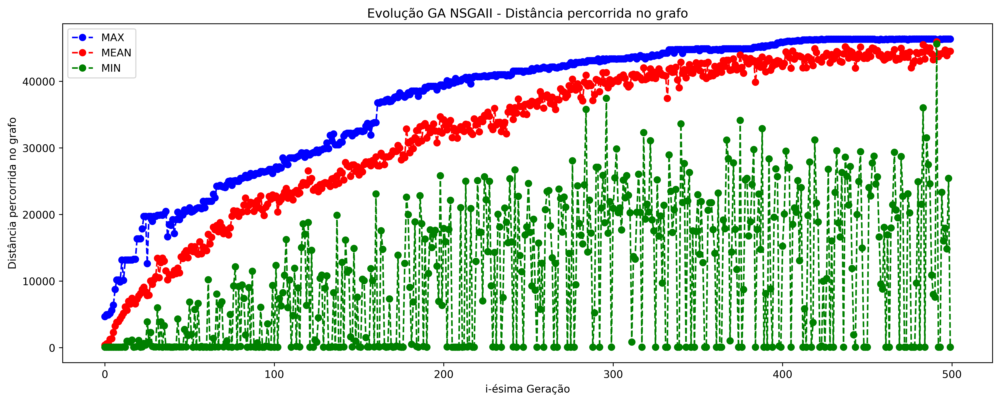

In [58]:
# obj 3
plt.figure(figsize=(16,6), dpi=600)
plt.plot(PlotMaxDistDFS, 'ob--' , label='MAX')
plt.plot(PlotMeanDistDFS, 'or--' ,label='MEAN')
plt.plot(PlotMinDistDFS, 'og--',label='MIN')
plt.xlabel('i-ésima Geração')
plt.ylabel('Distância percorrida no grafo')
plt.title('Evolução GA NSGAII - Distância percorrida no grafo')
plt.legend(loc='upper left')
plt.savefig("images/3-GraficoDistanciaPercorridaDFS.pdf",format=formato_imgs)
#plt.show()

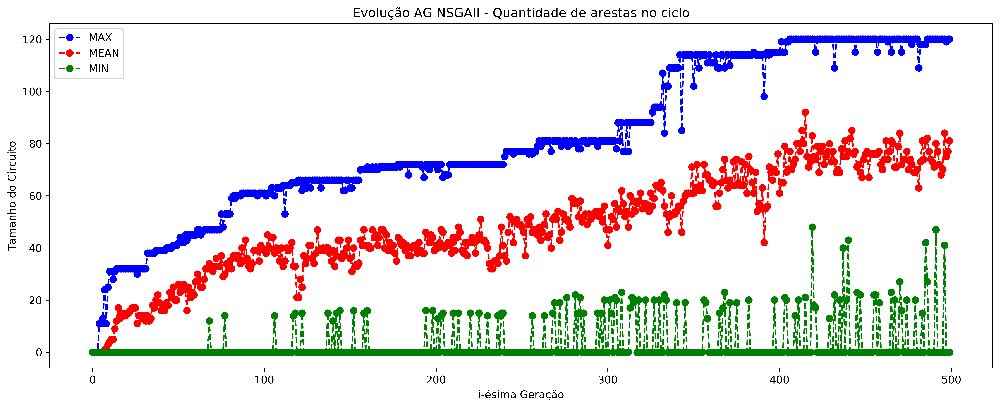

In [59]:
# obj 4
plt.figure(figsize=(16,6), dpi=600)
plt.plot(PlotMaxTamCiclo, 'ob--' , label='MAX')
plt.plot(PlotMeanTamCiclo, 'or--' ,label='MEAN')
plt.plot(PlotMinTamCiclo, 'og--',label='MIN')
plt.xlabel('i-ésima Geração')
plt.ylabel('Tamanho do Circuito')
plt.title('Evolução AG NSGAII - Quantidade de arestas no ciclo')
plt.legend(loc='upper left')
plt.savefig("images/3-GraficoTotArestasCiclo.pdf",format=formato_imgs)
#plt.show()

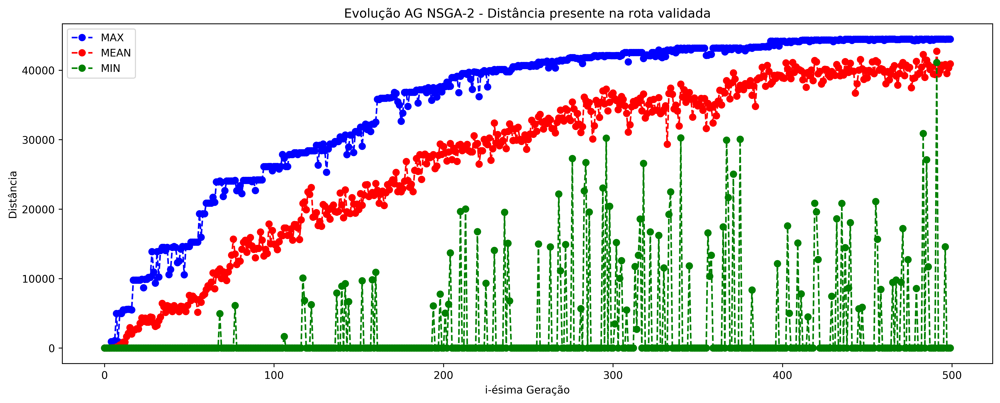

In [60]:
# obj 5
plt.figure(figsize=(16,6), dpi=600)
plt.plot(PlotMaxDistCiclo, 'ob--' , label='MAX')
plt.plot(PlotMeanDistCiclo, 'or--' ,label='MEAN')
plt.plot(PlotMinDistCiclo, 'og--',label='MIN')
plt.xlabel('i-ésima Geração')
plt.ylabel('Distância')
plt.title('Evolução AG NSGA-2 - Distância presente na rota validada')
plt.legend(loc='upper left')
plt.savefig("images/3-GraficoTamCicloRota.pdf",format=formato_imgs)

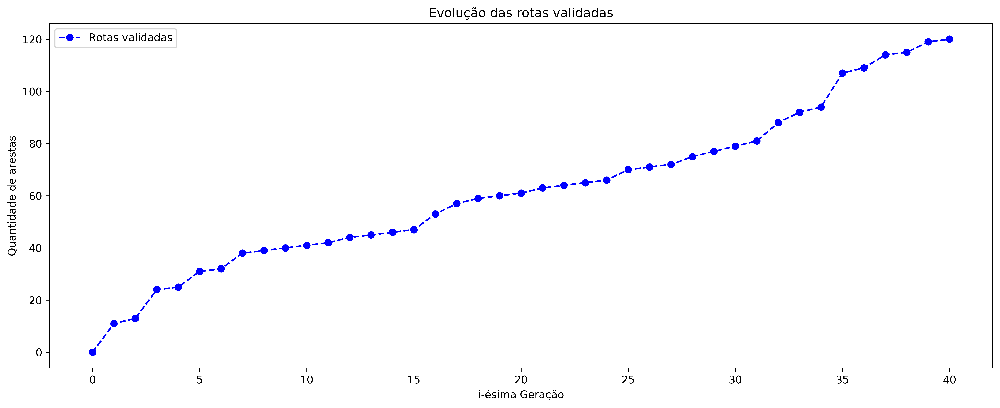

In [61]:
# rotas
plt.figure(figsize=(16,6), dpi=600)
plt.plot(PlotMaioresCiclos, 'ob--' , label='Rotas validadas')
plt.xlabel('i-ésima Geração')
plt.ylabel('Quantidade de arestas')
plt.title('Evolução das rotas validadas')
plt.legend(loc='upper left')
plt.savefig("images/3-GraficoTamanhoCiclos.pdf",format=formato_imgs)

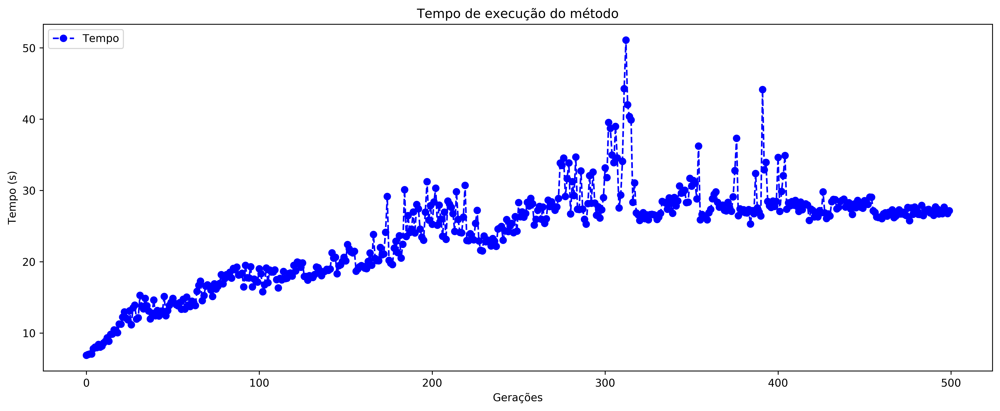

In [63]:
#
# tempo execução
plt.figure(figsize=(16,6), dpi=600)
plt.plot(PlotTempoExecucao, 'ob--' , label='Tempo')
plt.xlabel('Gerações')
plt.ylabel('Tempo (s)')
plt.title('Tempo de execução do método')
plt.legend(loc='upper left')
plt.savefig("images/3-GraficoTempo.pdf",format=formato_imgs)


# Plotagem das rotas geradas caso tenha encontrado

In [66]:
def salvarRotaTxt(via_vez, rota):
    try:
        path = "Rotas/Rota-"+str(via_vez)+".txt"
        arq = open(path, 'w')    
        for linha in rota:
            arq.write(linha+"\n")        
        arq.close()
    except:
        print("Erro salvar rota..")
    
def printFormatNamesStreet( via_vez , qtd_arestas, ruas ):
    
    try:
        contador = 1
        salvarText = []

        # +1 por causa do retorno do ciclo da rota    
        Rota = "Rota "+str(via_vez)+" - "+str(qtd_arestas)+" Arestas:\n"
        print(Rota)
        salvarText.append(Rota)

        for rua in ruas:
            concat = str(rua)
            #Rua = ""+str(contador)+"ª - "+concat
            Rua = ""+concat
            print(Rua)
            salvarText.append(Rua)
            contador = contador + 1

        Rua = ""+str(contador)+"ª - "+ruas[0]
        print(Rua)
        salvarText.append(Rua)

        salvarRotaTxt(via_vez, salvarText)
    except:
        print("Erro pegar rota..")
        
def printRotaRuas(via_vez, qtd_arestas, rota ):
    
    try:
                
        tamListaDadosNew = len(listaDadosNew)
        tamRotaLista = len(rota)

        ruasRota = []

        '''
            Arrumar os nomes das ruas..
        '''


        for rota_i in range( tamRotaLista ):            
            for lista_i in range(tamListaDadosNew):            
                if( listaDadosNew[lista_i][0] == rota[rota_i][0] and listaDadosNew[lista_i][1] == rota[rota_i][1] ):

                    if 'name' in listaDadosNew[lista_i][2]:
                        rua = listaDadosNew[lista_i][2]['name']

                        if rua not in ruasRota:
                            ruasRota.append(rua)

                    else:
                        ruasRota.append("Unname")

                    '''
                    print(listaDadosNew[lista_i])
                    print(rota[rota_i])
                    print()
                    '''                    

        printFormatNamesStreet(via_vez, qtd_arestas, ruasRota )
        print("\n\n")

    except:
        print("Erro...")
        

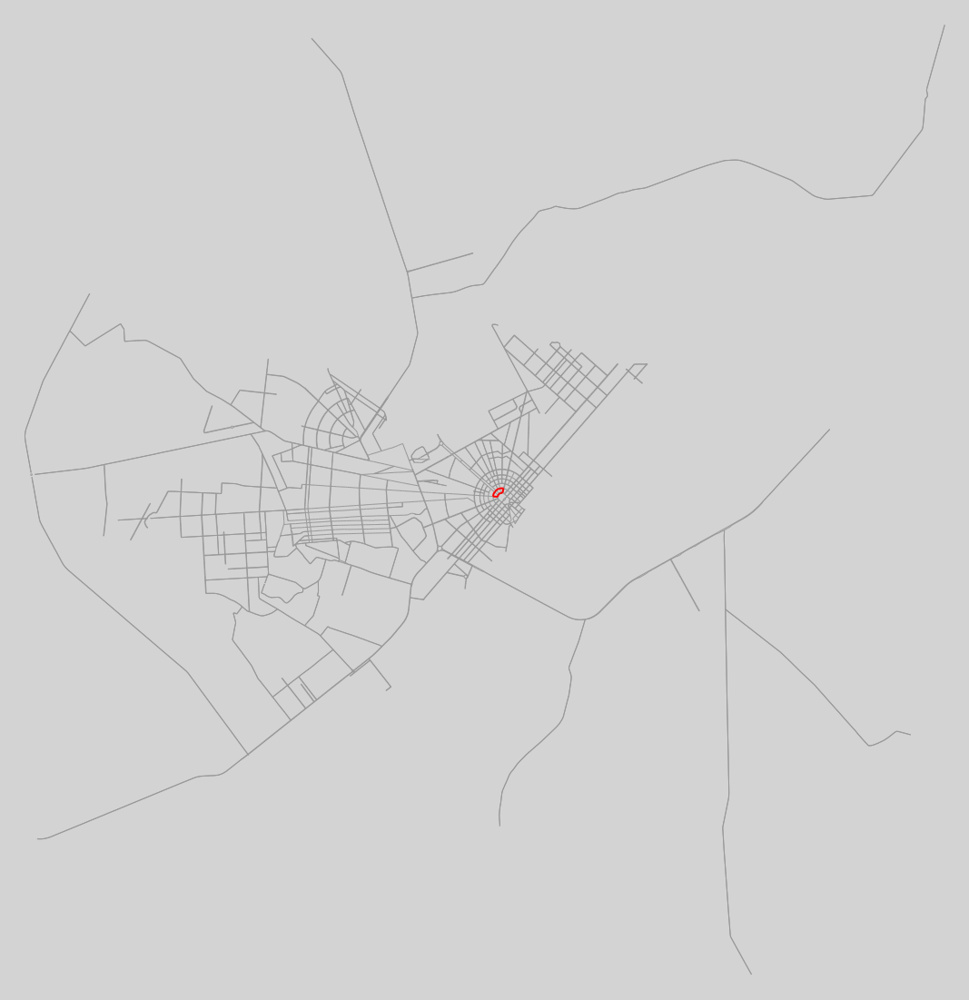



Rota 1 - 11 Arestas:

Avenida Amazonas
Avenida Mário Homem de Melo
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Avenida Capitão Júlio Bezerra
7ª - Avenida Amazonas





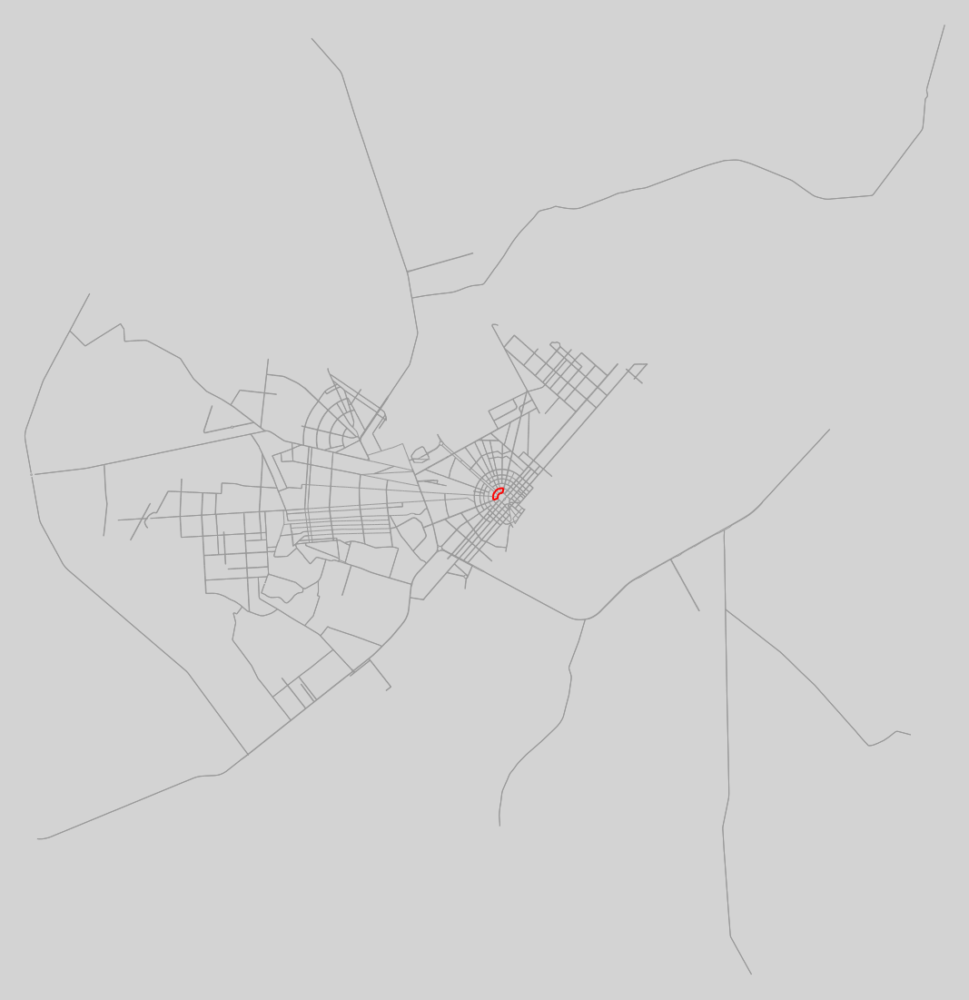



Rota 2 - 13 Arestas:

Avenida Amazonas
Avenida Glaycon de Paiva
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Avenida Capitão Júlio Bezerra
7ª - Avenida Amazonas





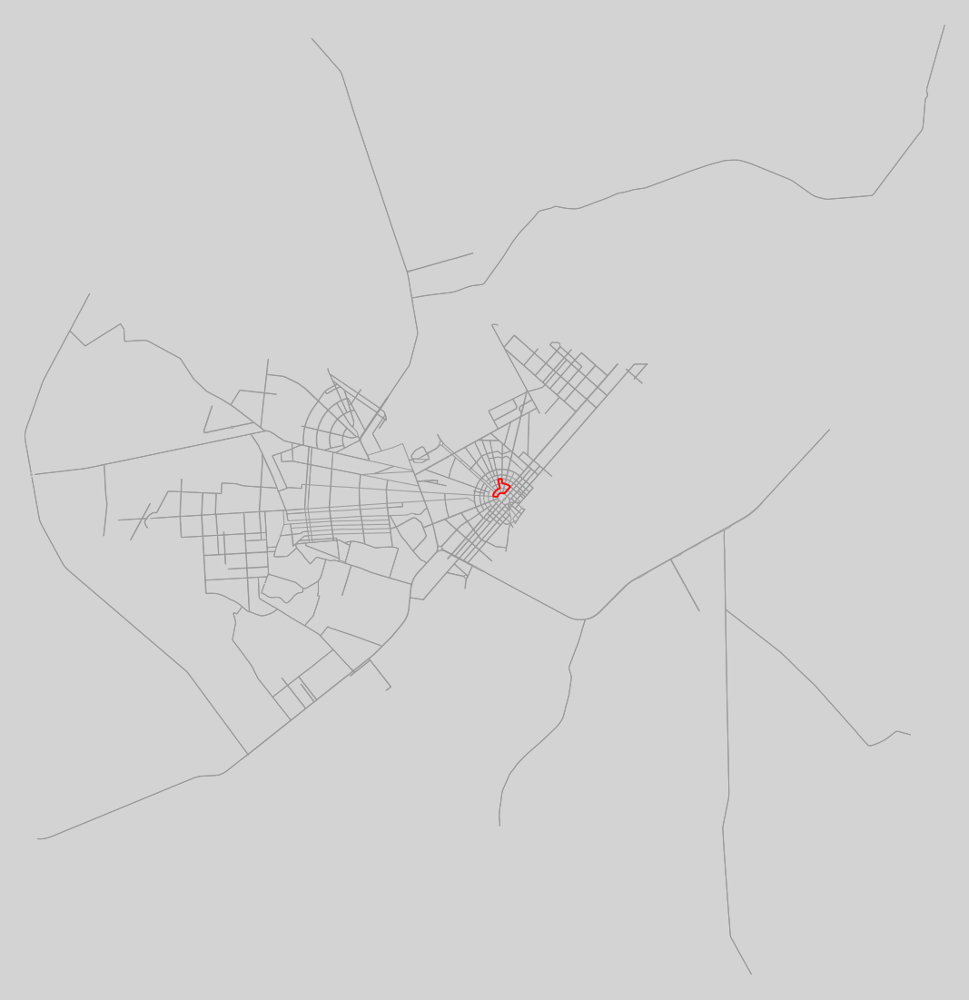



Rota 3 - 24 Arestas:

Avenida Amazonas
Avenida Mário Homem de Melo
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Rua Professor Agnelo Bitencourt
Rua Barão do Rio Branco
Rua Alferes Paulo Saldanha
Rua Alfredo Cruz
Avenida Ville Roy
11ª - Avenida Amazonas





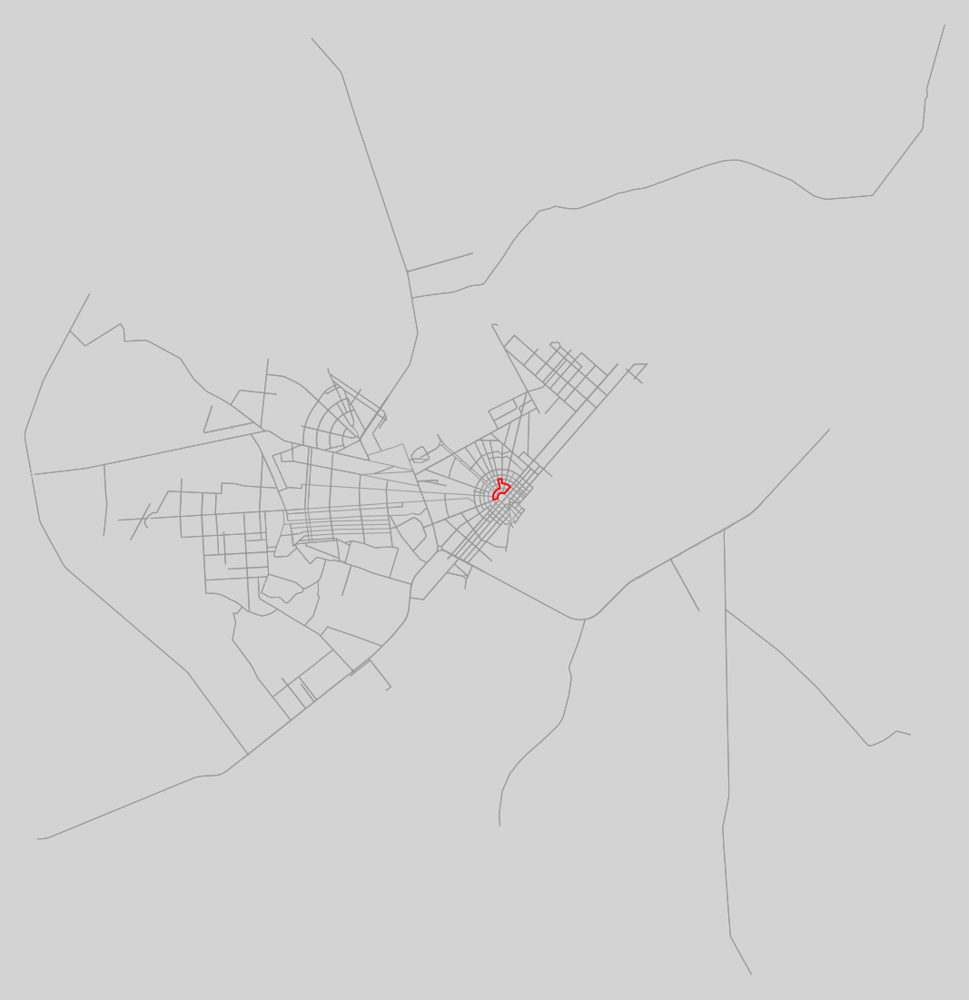



Rota 4 - 25 Arestas:

Avenida Amazonas
Avenida Glaycon de Paiva
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Rua Professor Agnelo Bitencourt
Rua Barão do Rio Branco
Rua Alferes Paulo Saldanha
Rua Alfredo Cruz
Avenida Ville Roy
11ª - Avenida Amazonas





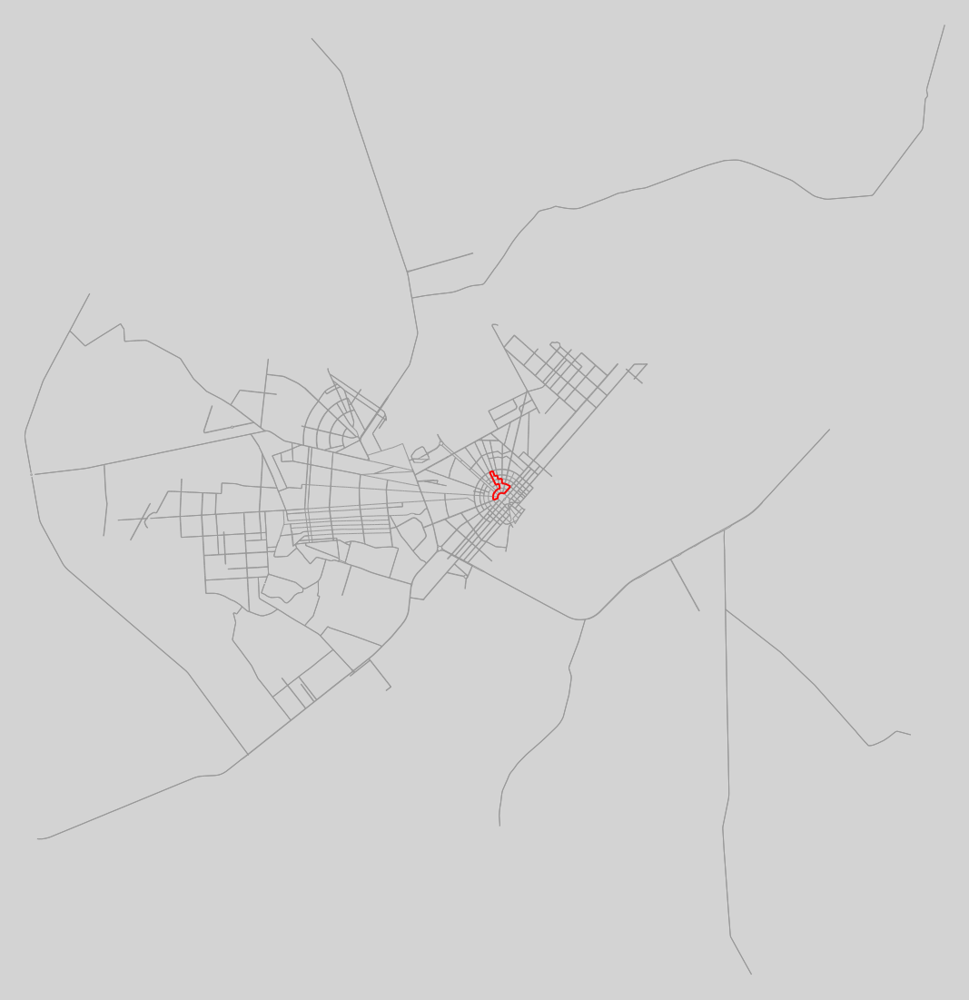



Rota 5 - 31 Arestas:

Avenida Amazonas
Avenida Glaycon de Paiva
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Rua Professor Agnelo Bitencourt
Rua Alfredo Cruz
Rua General Penha Brasil
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Barão do Rio Branco
Rua Alferes Paulo Saldanha
Avenida Ville Roy
15ª - Avenida Amazonas





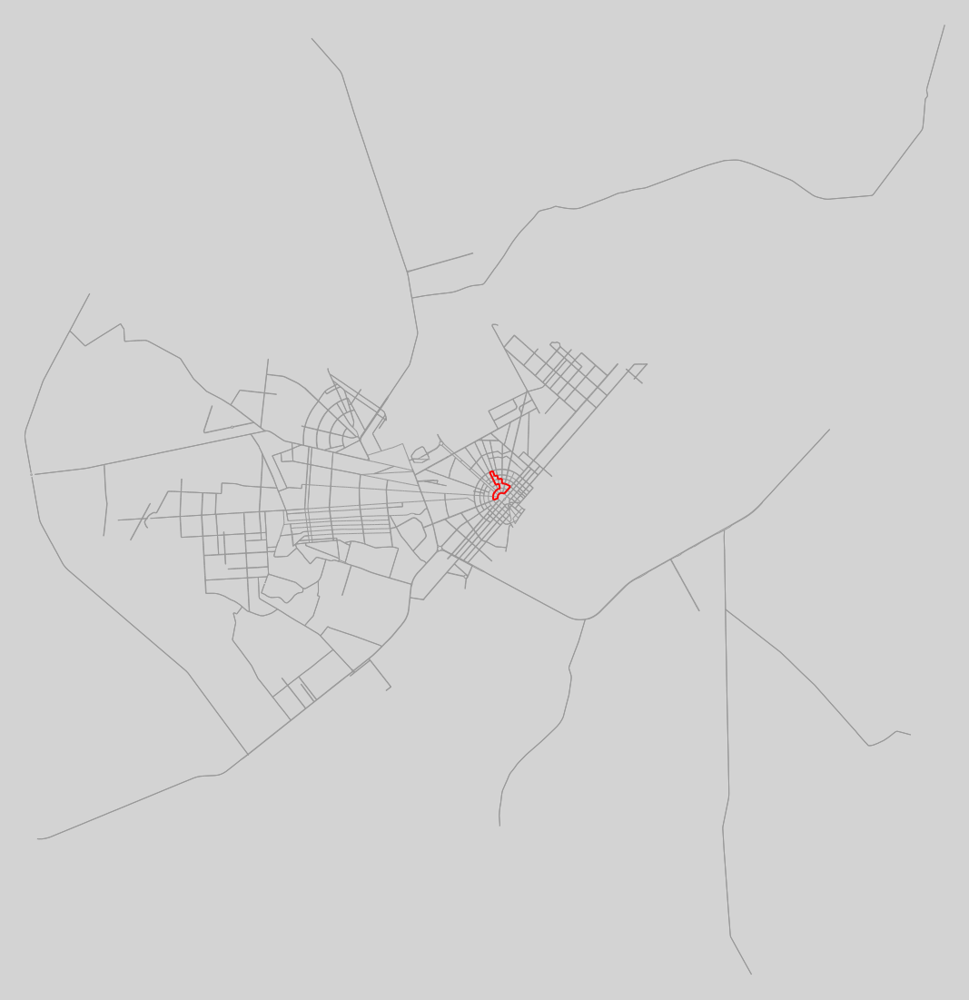



Rota 6 - 32 Arestas:

Avenida Amazonas
Avenida Glaycon de Paiva
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Rua Professor Agnelo Bitencourt
Rua Alfredo Cruz
Rua General Penha Brasil
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Barão do Rio Branco
Rua Alferes Paulo Saldanha
Avenida Ville Roy
15ª - Avenida Amazonas





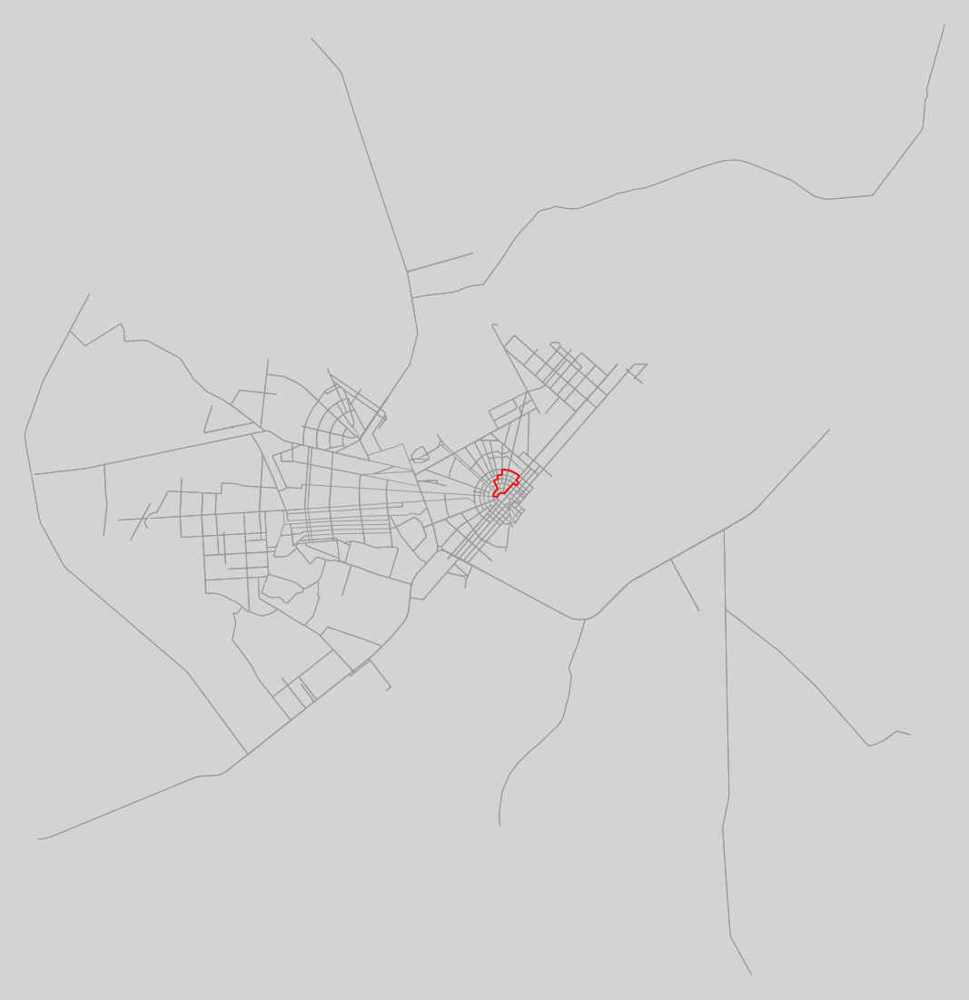



Rota 7 - 38 Arestas:

Avenida Amazonas
Avenida Mário Homem de Melo
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Rua General Penha Brasil
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Rua Coronel Mota
Rua Alferes Paulo Saldanha
Avenida Major Williams
Avenida Ville Roy
Avenida Nossa Senhora da Consolata
14ª - Avenida Amazonas





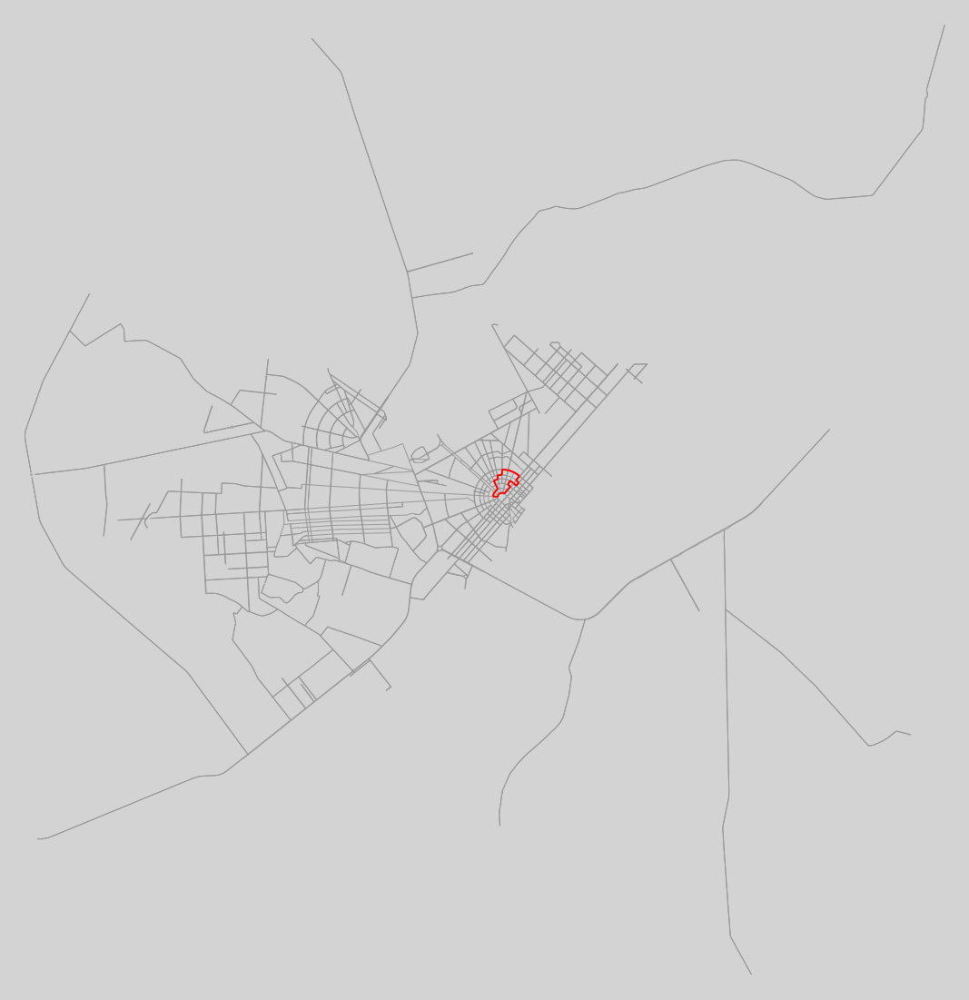



Rota 8 - 39 Arestas:

Avenida Amazonas
Avenida Mário Homem de Melo
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Rua General Penha Brasil
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Rua Coronel Mota
Rua Alferes Paulo Saldanha
Avenida Major Williams
Avenida Ville Roy
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
Rua Alfredo Cruz
16ª - Avenida Amazonas





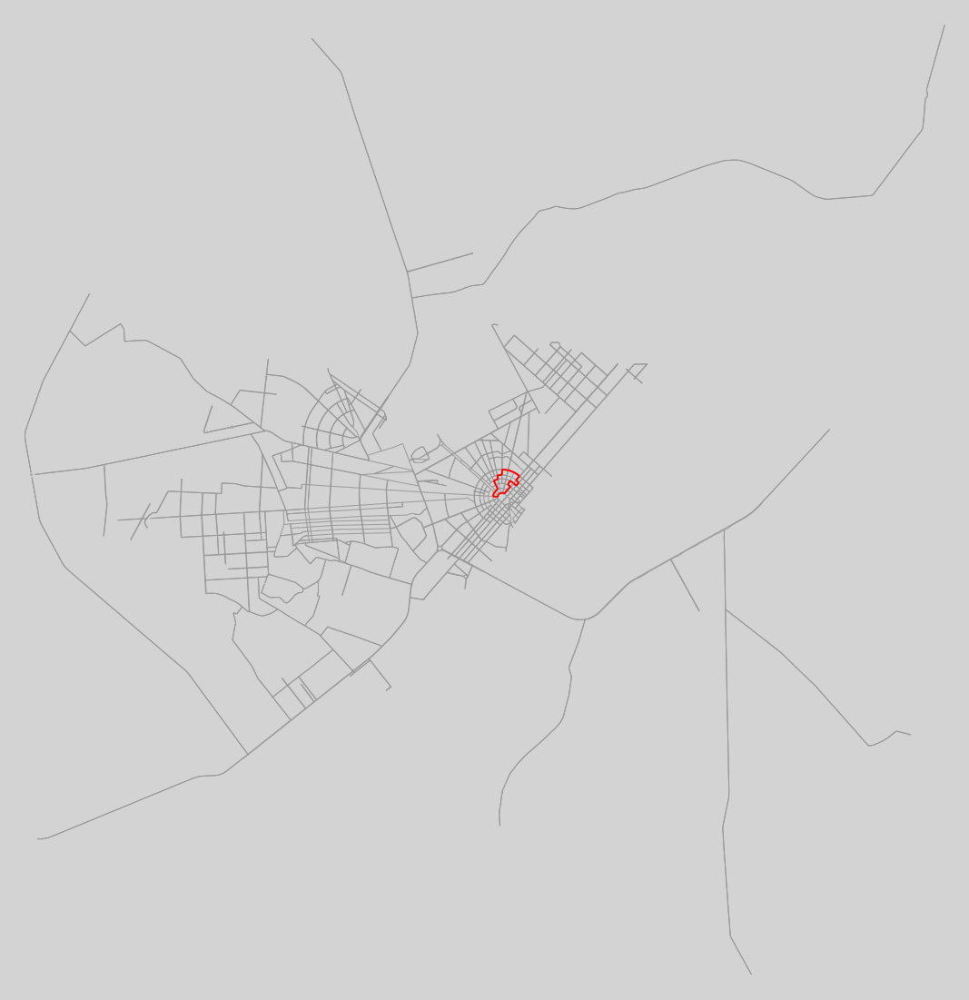



Rota 9 - 40 Arestas:

Avenida Amazonas
Avenida Mário Homem de Melo
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Rua General Penha Brasil
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Rua Coronel Mota
Rua Alferes Paulo Saldanha
Avenida Major Williams
Avenida Ville Roy
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
Rua Alfredo Cruz
16ª - Avenida Amazonas





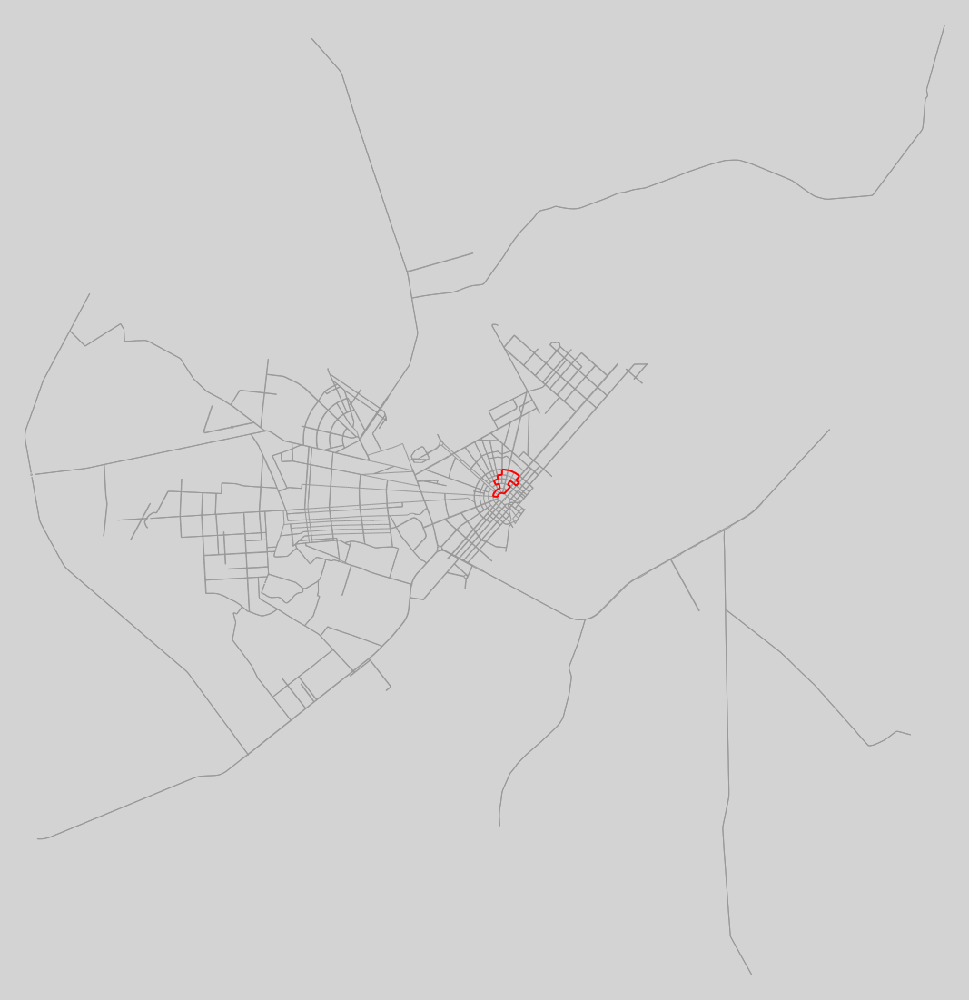



Rota 10 - 41 Arestas:

Avenida Amazonas
Avenida Mário Homem de Melo
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Rua Professor Agnelo Bitencourt
Rua Alfredo Cruz
Rua General Penha Brasil
Rua Barão do Rio Branco
Rua Coronel Mota
Rua Alferes Paulo Saldanha
Avenida Major Williams
Avenida Ville Roy
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
16ª - Avenida Amazonas





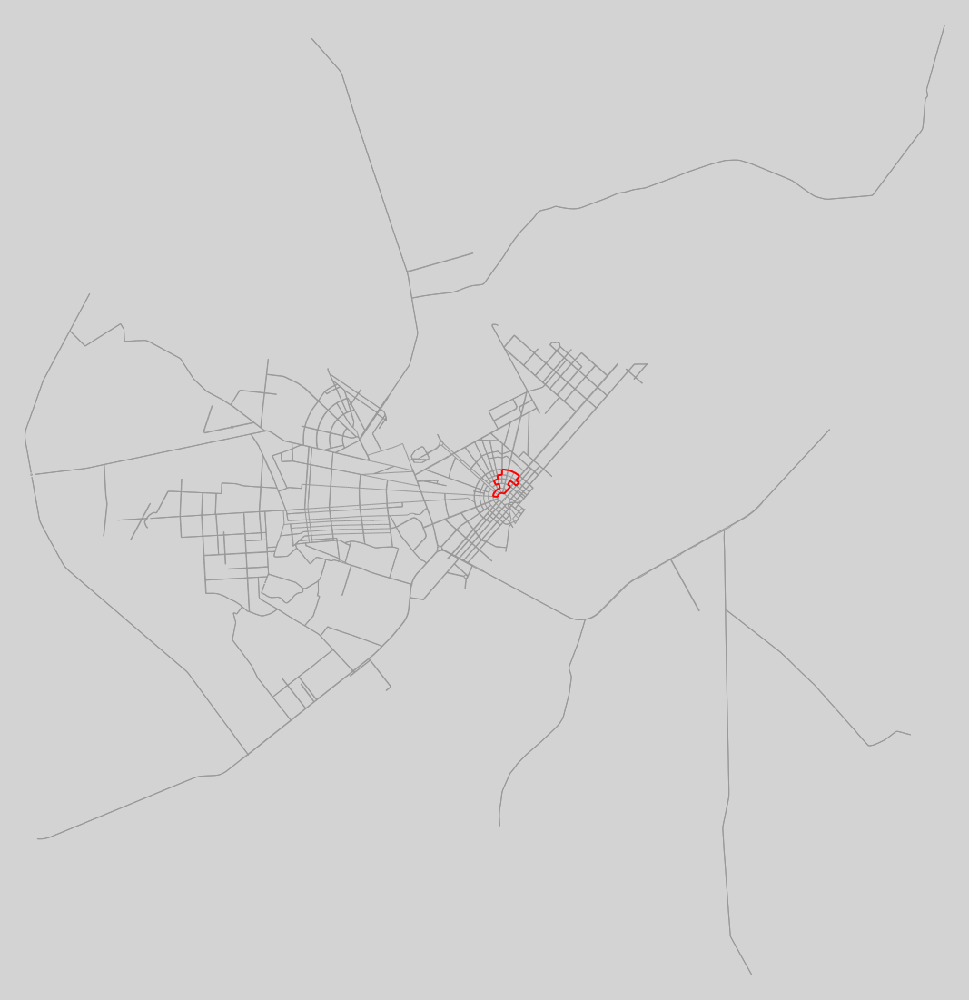



Rota 11 - 42 Arestas:

Avenida Amazonas
Avenida Mário Homem de Melo
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Rua Professor Agnelo Bitencourt
Rua Alfredo Cruz
Rua General Penha Brasil
Rua Barão do Rio Branco
Rua Coronel Mota
Rua Alferes Paulo Saldanha
Avenida Major Williams
Avenida Ville Roy
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
16ª - Avenida Amazonas





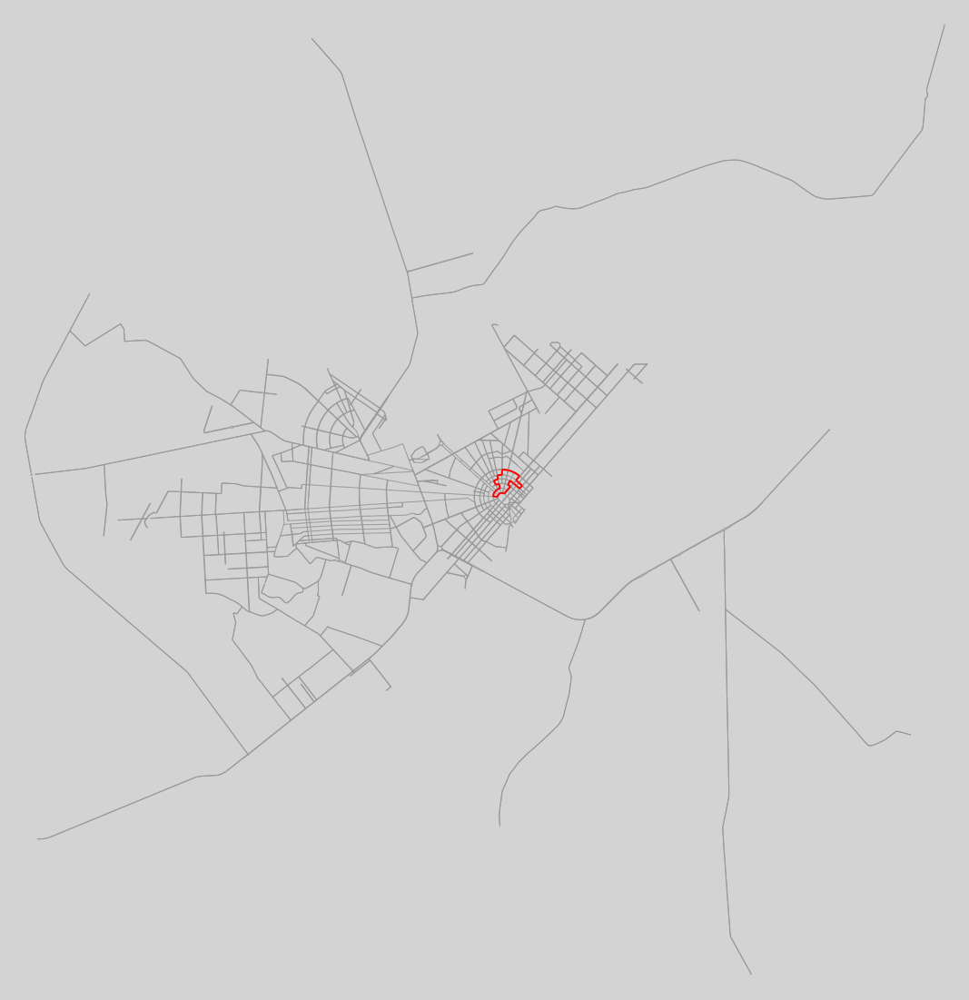



Rota 12 - 44 Arestas:

Avenida Amazonas
Avenida Mário Homem de Melo
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Rua Professor Agnelo Bitencourt
Rua Alfredo Cruz
Rua General Penha Brasil
Rua Barão do Rio Branco
Rua Coronel Mota
Rua Alferes Paulo Saldanha
Avenida Major Williams
Avenida Ville Roy
Avenida Benjamin Constant
Rua Rocha Leal
16ª - Avenida Amazonas





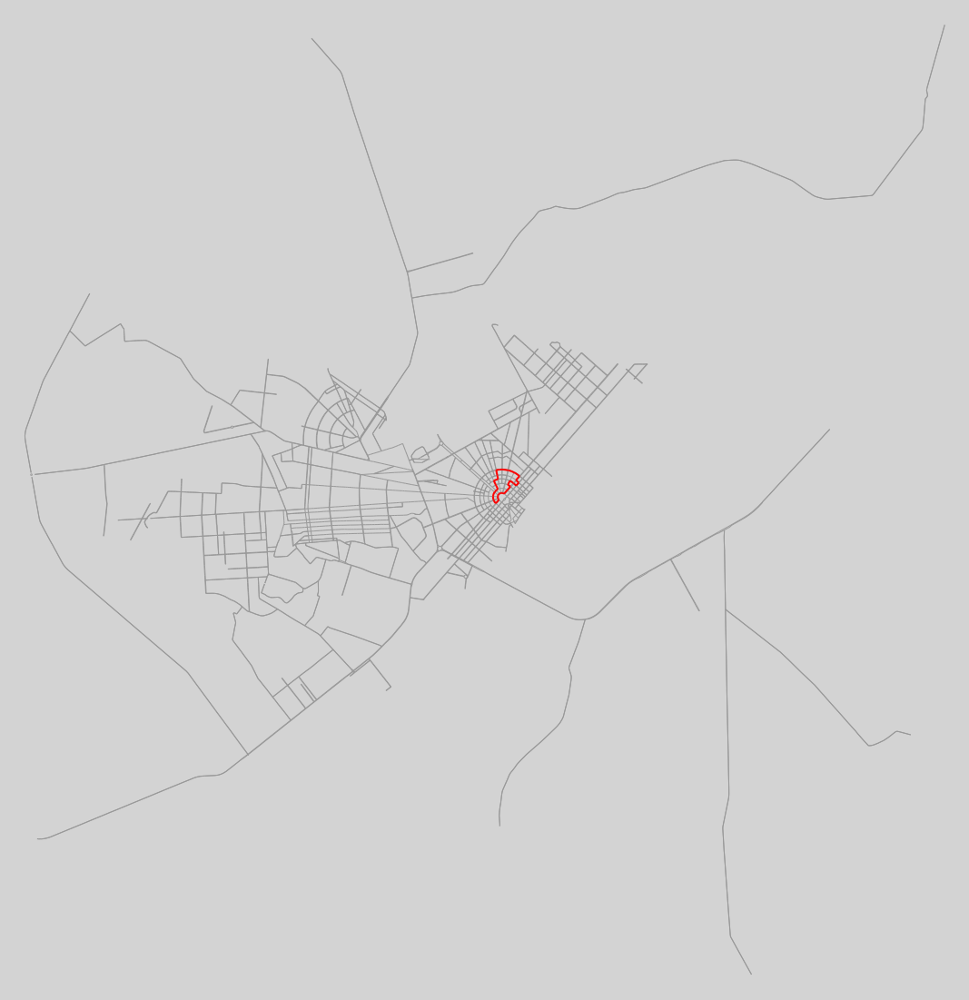



Rota 13 - 45 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Rua General Penha Brasil
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Avenida Major Williams
Rua Coronel Mota
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
Rua Alfredo Cruz
14ª - Avenida Amazonas





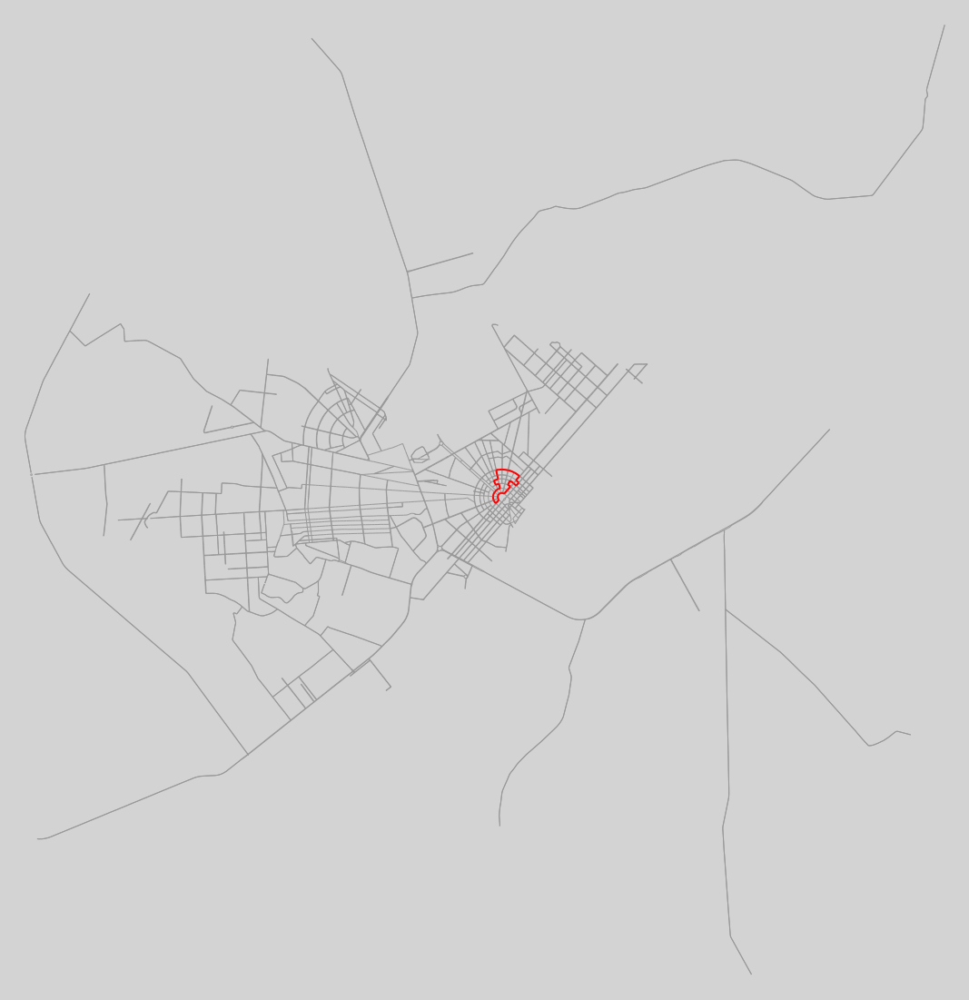



Rota 14 - 46 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Rua Professor Agnelo Bitencourt
Rua Alfredo Cruz
Rua General Penha Brasil
Rua Barão do Rio Branco
Avenida Major Williams
Rua Coronel Mota
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
14ª - Avenida Amazonas





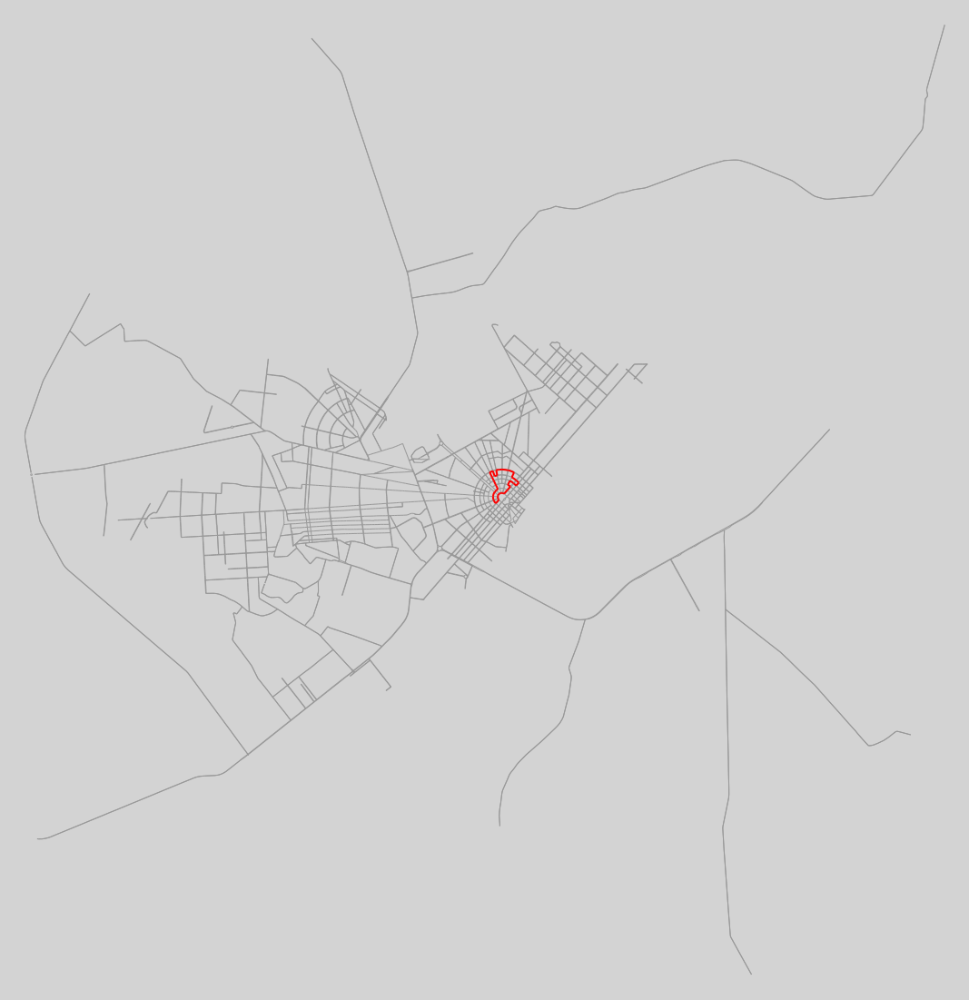



Rota 15 - 47 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Capitão Ene Garcez
Rua Coronel Pinto
Rua General Penha Brasil
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Professor Agnelo Bitencourt
Rua Rocha Leal
Avenida Nossa Senhora da Consolata
Rua Barão do Rio Branco
Rua Alfredo Cruz
15ª - Avenida Amazonas





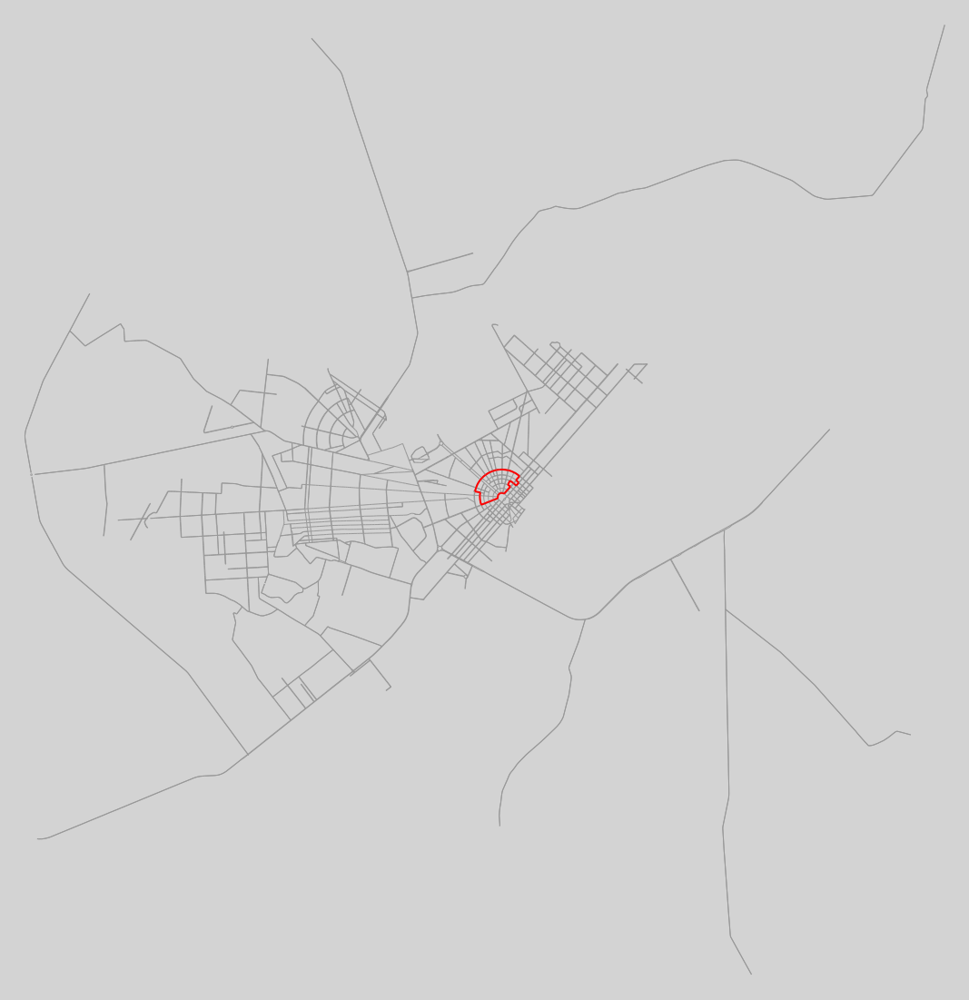



Rota 16 - 53 Arestas:

Avenida Amazonas
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Major Williams
Avenida Ville Roy
Rua Coronel Mota
Avenida Nossa Senhora da Consolata
Rua Barão do Rio Branco
Rua Rocha Leal
Rua Alfredo Cruz
13ª - Avenida Amazonas





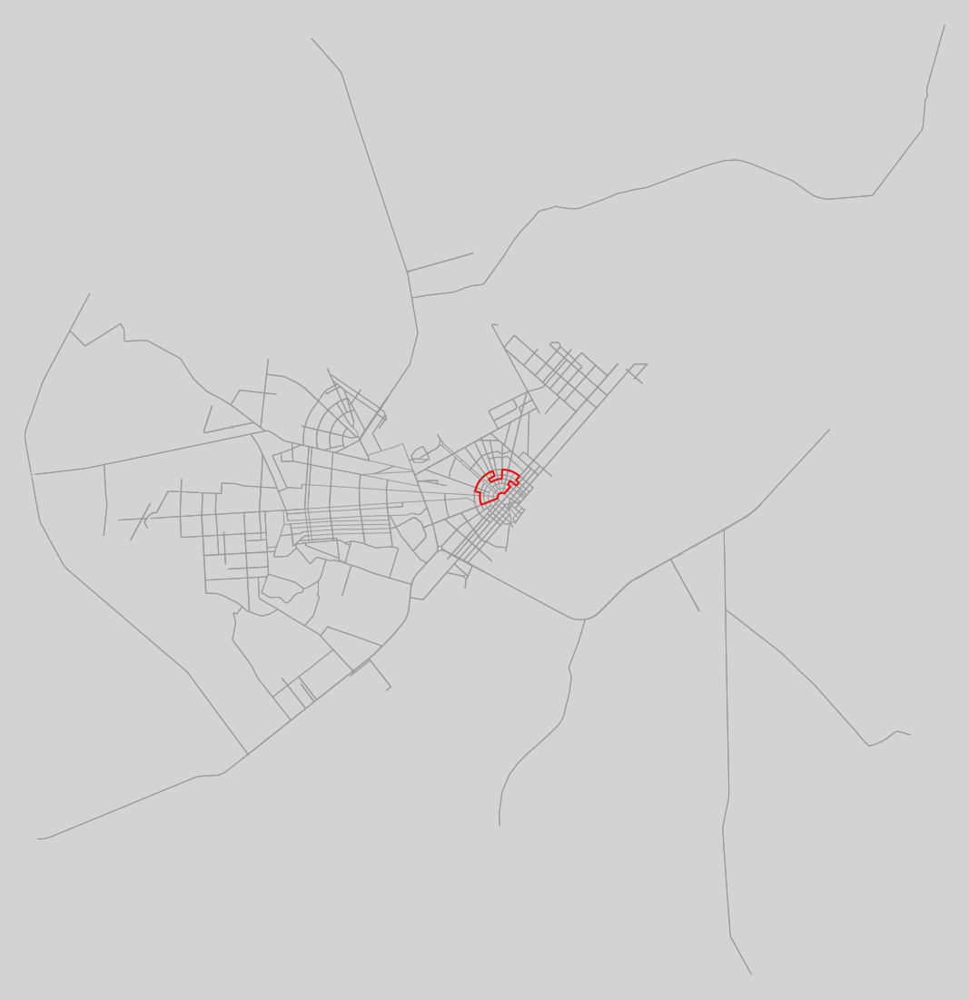



Rota 17 - 57 Arestas:

Avenida Amazonas
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Major Manoel Correia
Rua Barão do Rio Branco
Rua Alferes Paulo Saldanha
Avenida Ville Roy
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
Rua Alfredo Cruz
16ª - Avenida Amazonas





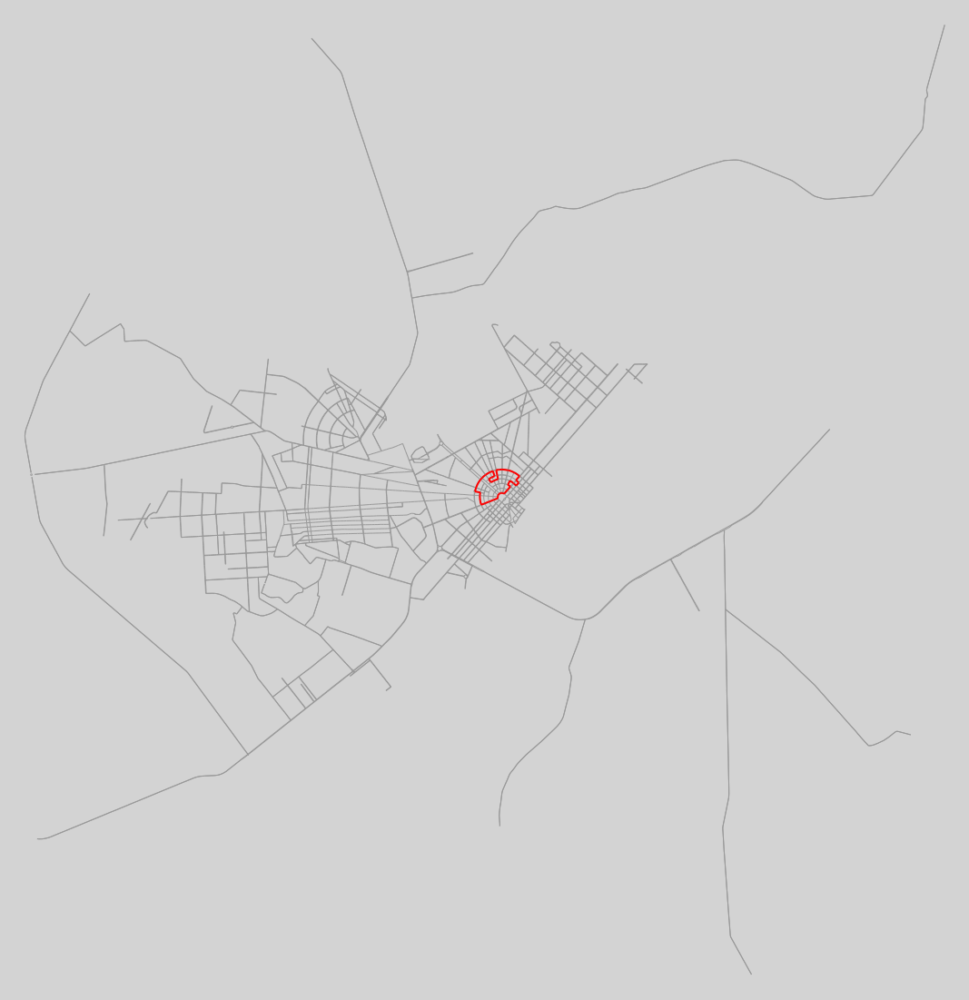



Rota 18 - 59 Arestas:

Avenida Amazonas
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Major Manoel Correia
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Avenida Ville Roy
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
Rua Alfredo Cruz
16ª - Avenida Amazonas





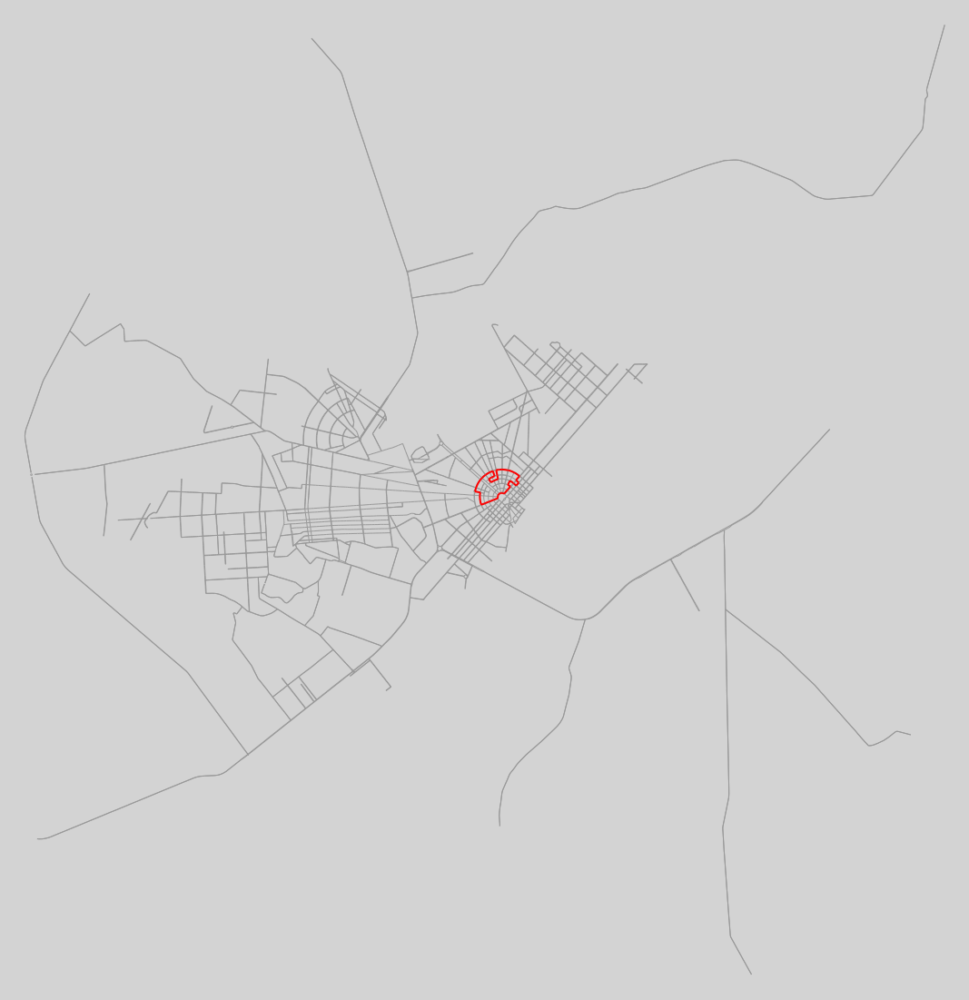



Rota 19 - 60 Arestas:

Avenida Amazonas
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Major Manoel Correia
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Avenida Ville Roy
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
Rua Alfredo Cruz
16ª - Avenida Amazonas





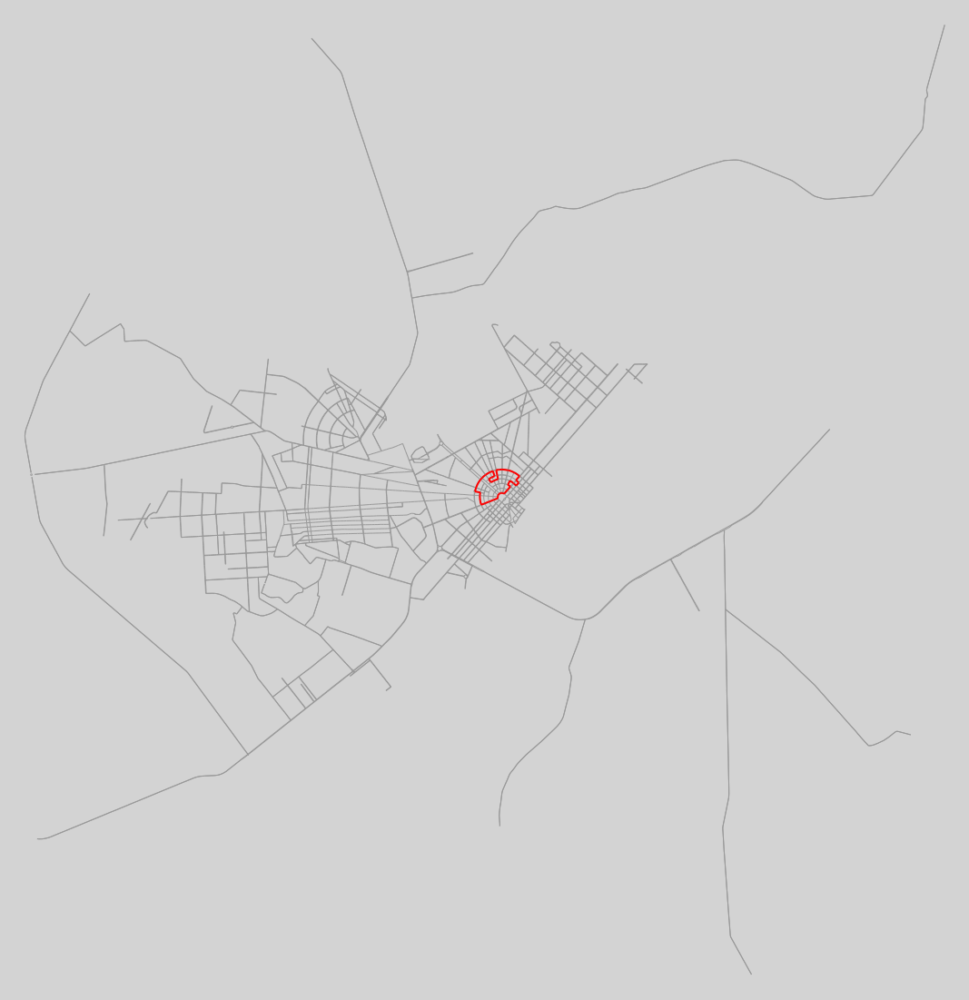



Rota 20 - 61 Arestas:

Avenida Amazonas
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Major Manoel Correia
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Avenida Ville Roy
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
Rua Alfredo Cruz
16ª - Avenida Amazonas





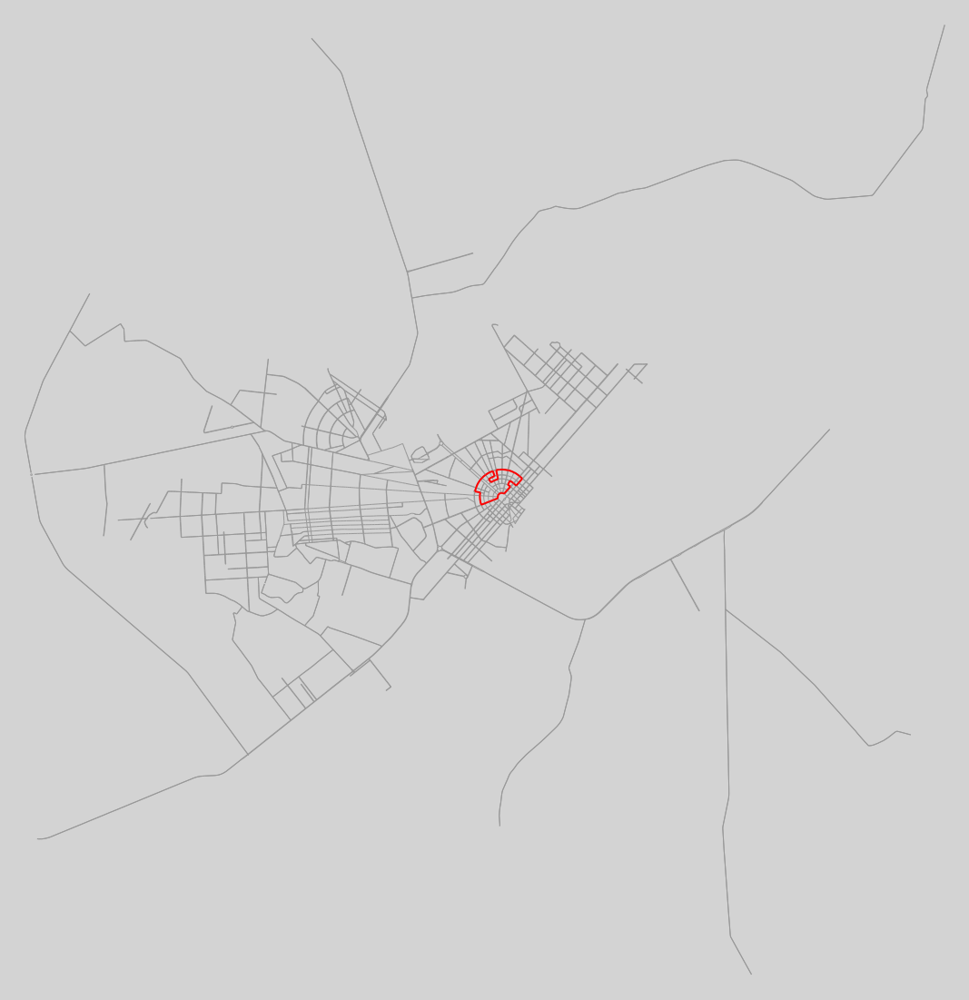



Rota 21 - 63 Arestas:

Avenida Amazonas
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Major Manoel Correia
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
Rua Alfredo Cruz
Avenida Ville Roy
17ª - Avenida Amazonas





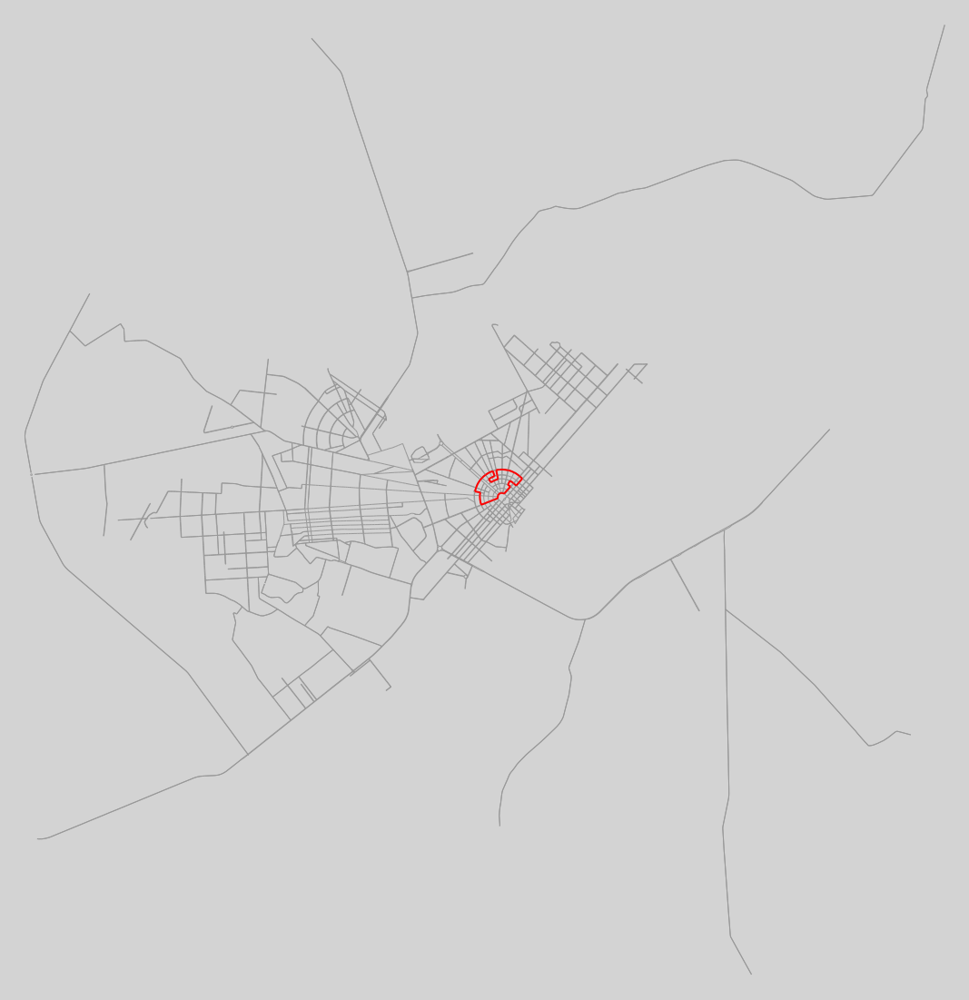



Rota 22 - 64 Arestas:

Avenida Amazonas
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Major Manoel Correia
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
Rua Alfredo Cruz
Avenida Ville Roy
17ª - Avenida Amazonas





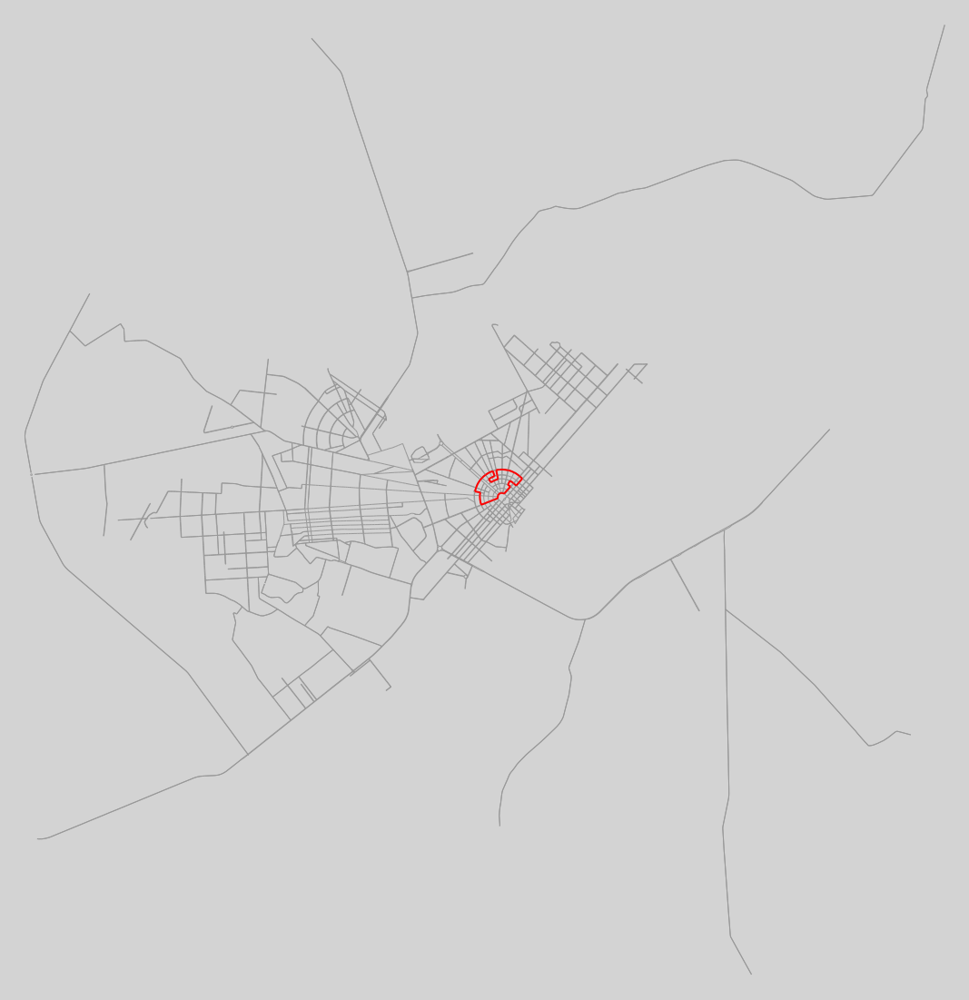



Rota 23 - 65 Arestas:

Avenida Amazonas
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Major Manoel Correia
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
Rua Alfredo Cruz
Avenida Ville Roy
17ª - Avenida Amazonas





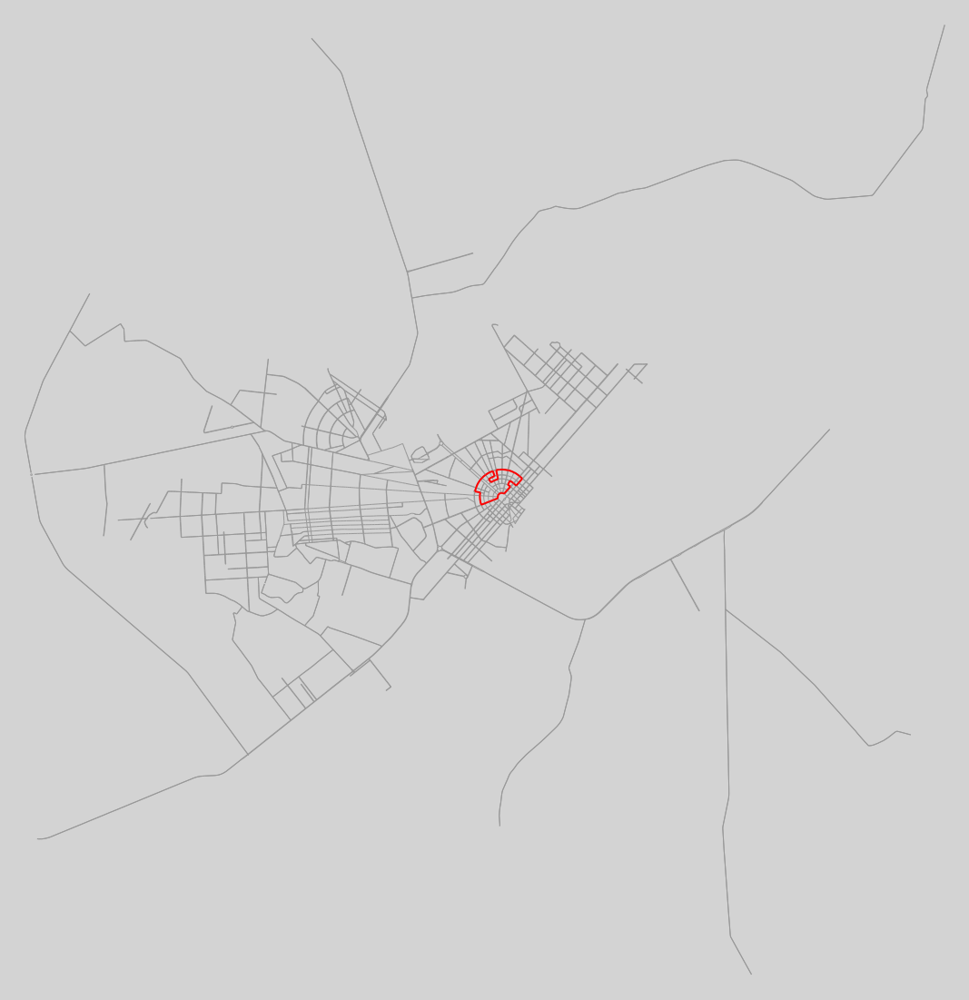



Rota 24 - 66 Arestas:

Avenida Amazonas
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Major Manoel Correia
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
Rua Alfredo Cruz
Avenida Ville Roy
17ª - Avenida Amazonas





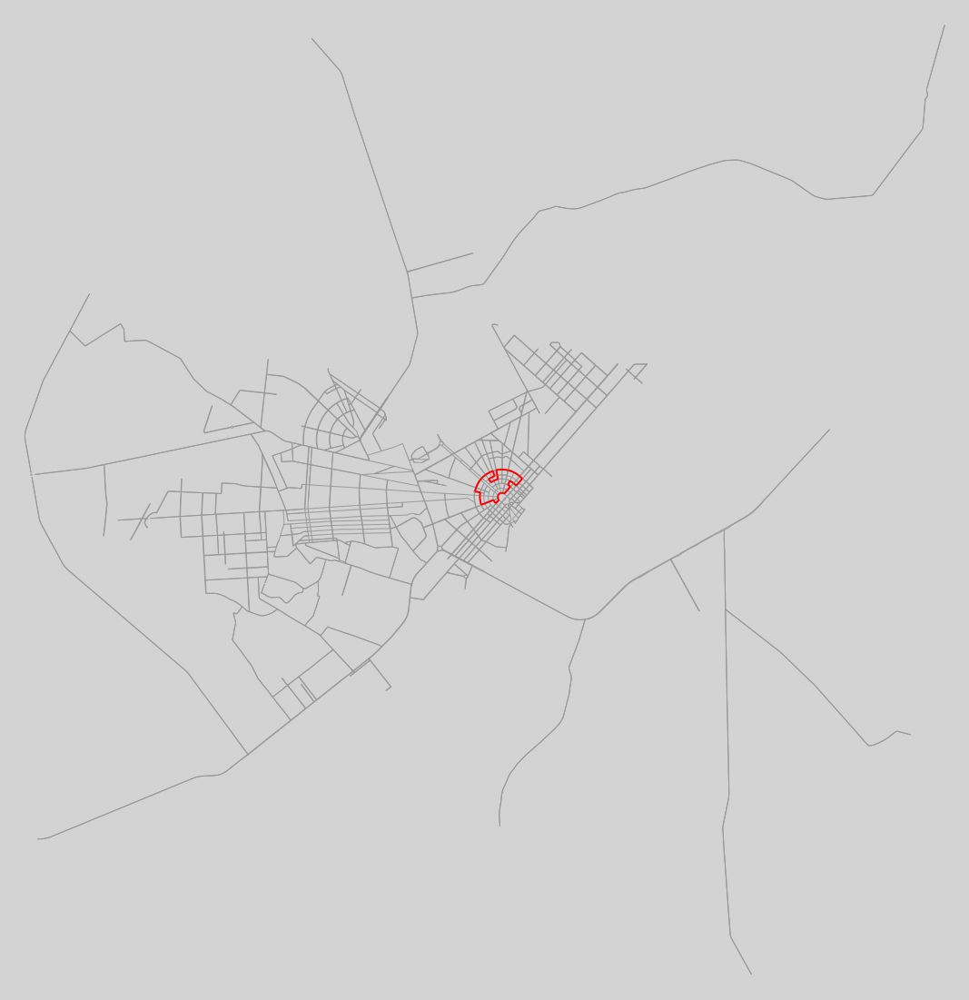



Rota 25 - 70 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Major Manoel Correia
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
Rua Alfredo Cruz
18ª - Avenida Amazonas





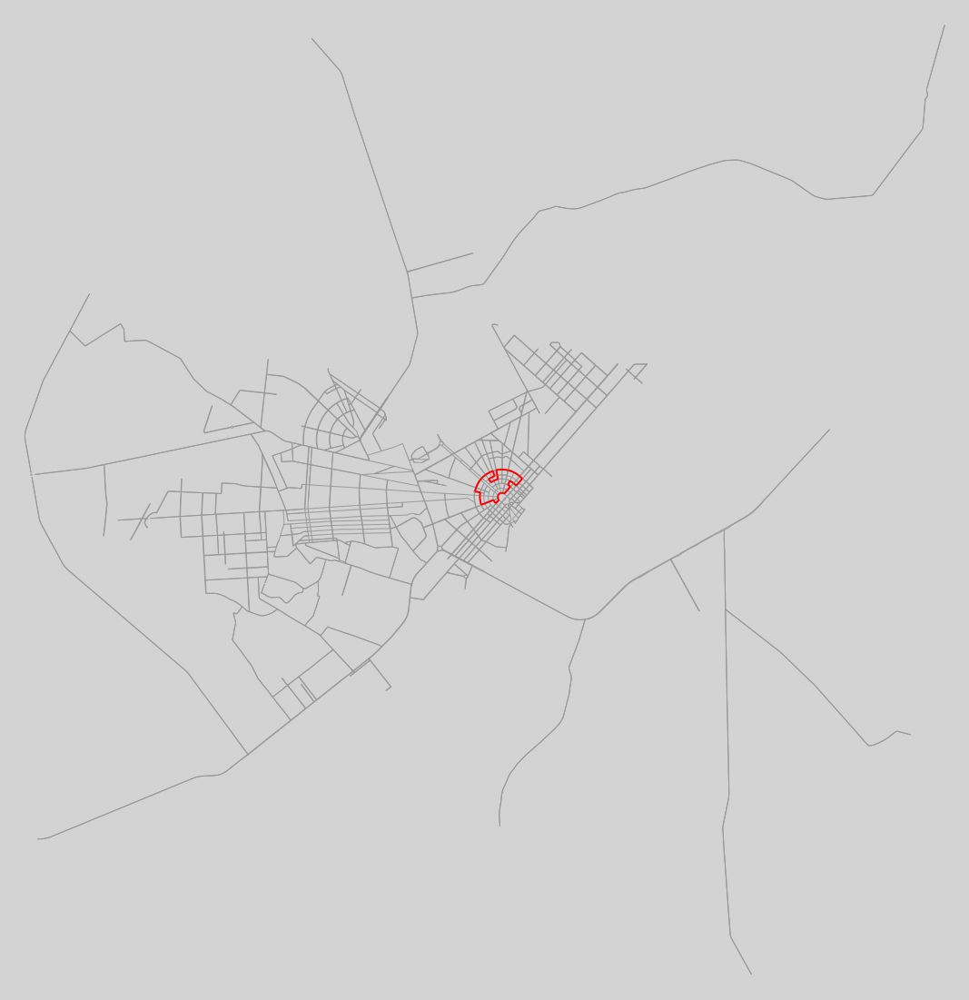



Rota 26 - 71 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Major Manoel Correia
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
Rua Alfredo Cruz
18ª - Avenida Amazonas





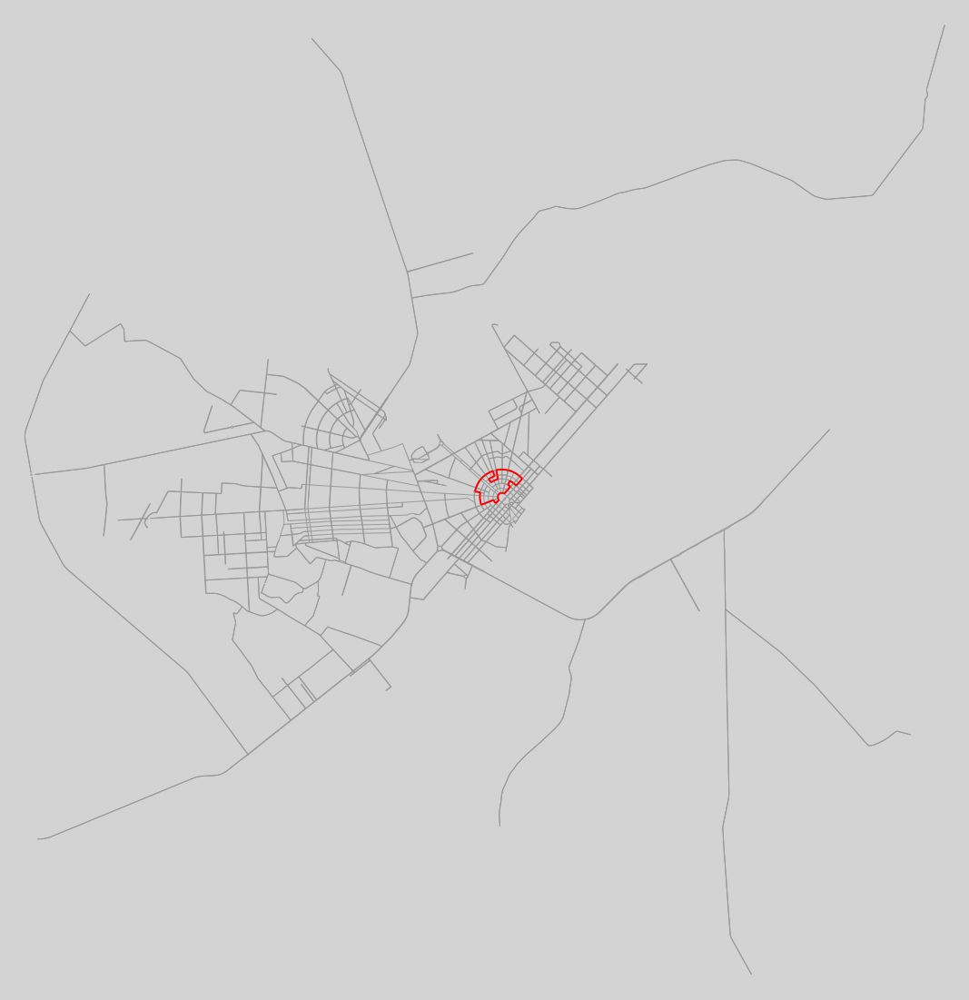



Rota 27 - 72 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Major Manoel Correia
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Avenida Nossa Senhora da Consolata
Rua Rocha Leal
Rua Alfredo Cruz
18ª - Avenida Amazonas





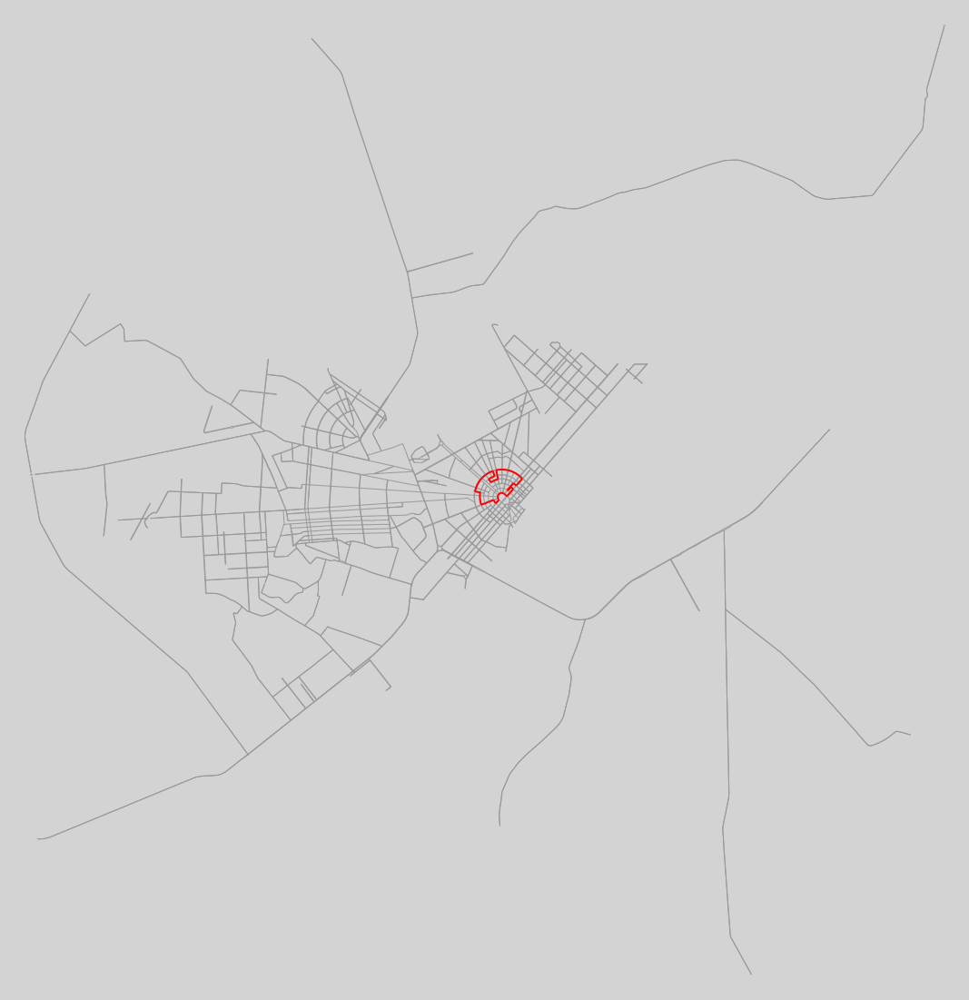



Rota 28 - 75 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Major Manoel Correia
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Avenida Nossa Senhora da Consolata
Rua Coronel Pinto
Rua Alfredo Cruz
18ª - Avenida Amazonas





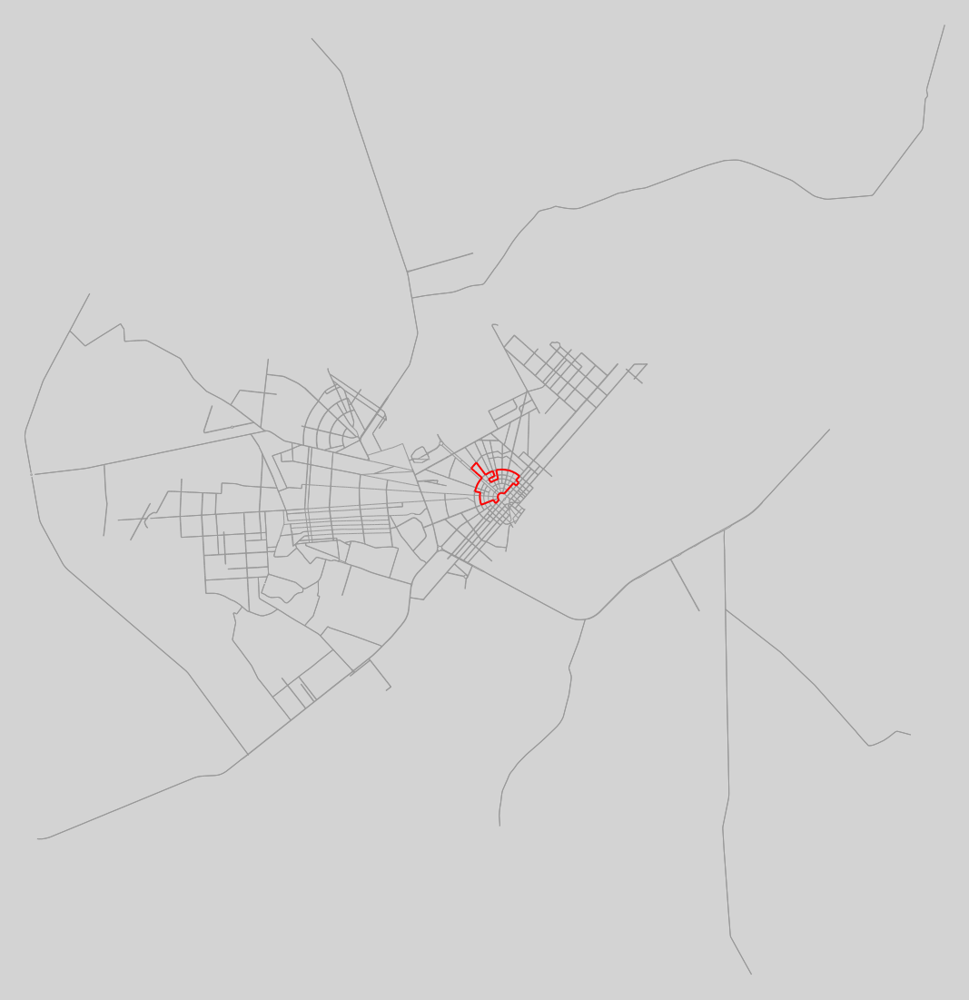



Rota 29 - 77 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Capitão Ene Garcês
Avenida Forte São Joaquim
Rua Major Manoel Correia
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Avenida Nossa Senhora da Consolata
17ª - Avenida Amazonas





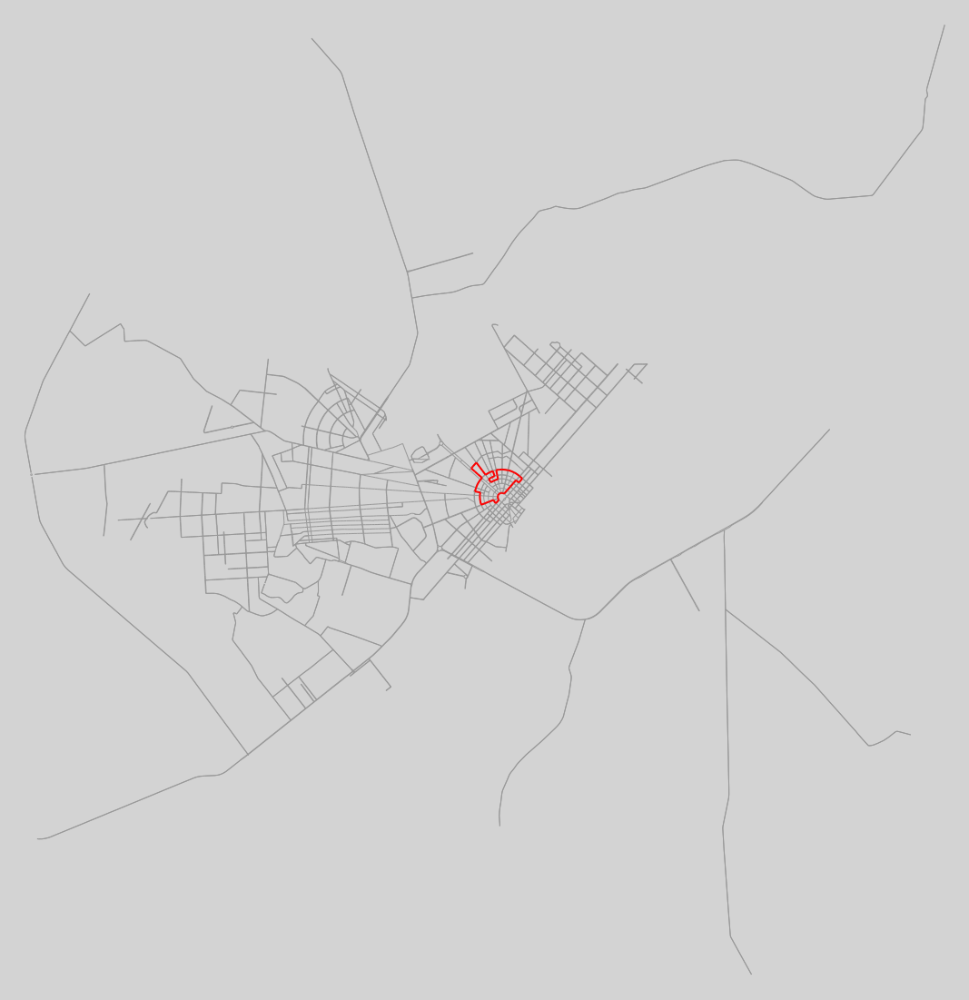



Rota 30 - 79 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Capitão Ene Garcês
Avenida Forte São Joaquim
Rua Major Manoel Correia
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Avenida Nossa Senhora da Consolata
18ª - Avenida Amazonas





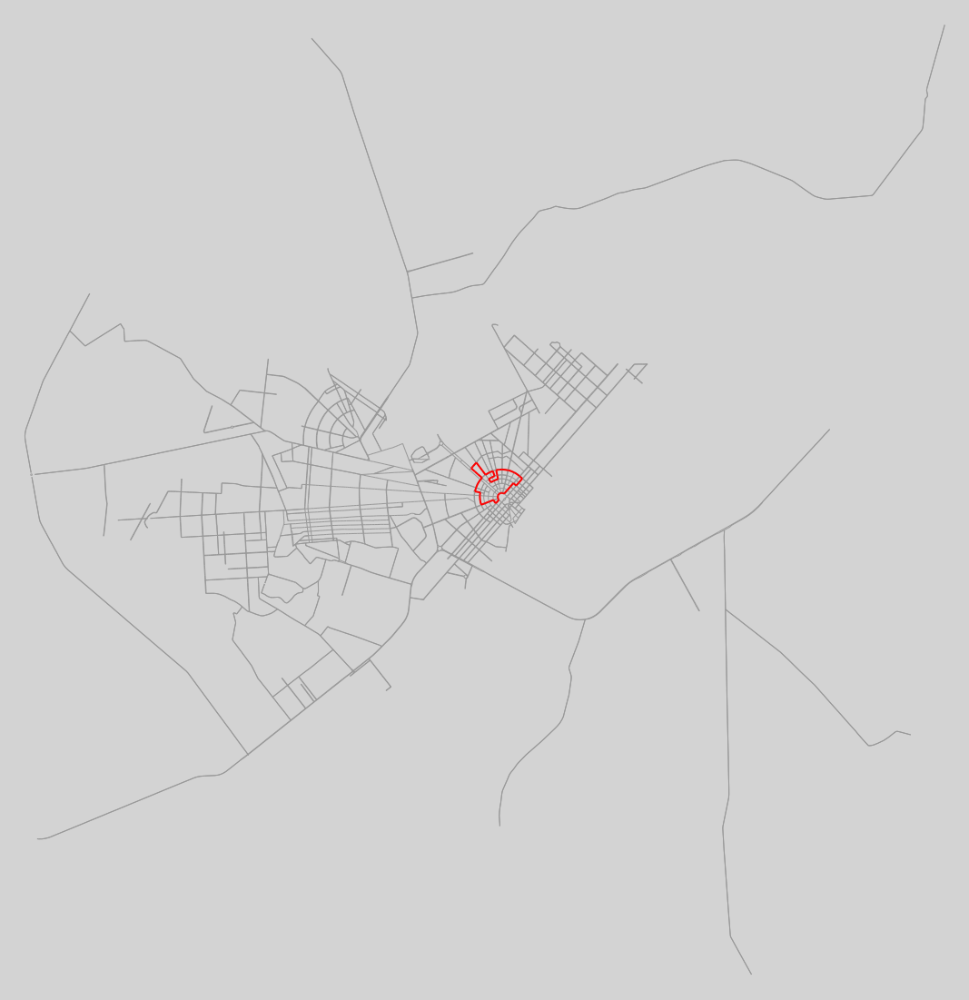



Rota 31 - 81 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Capitão Ene Garcês
Avenida Forte São Joaquim
Rua Major Manoel Correia
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Avenida Nossa Senhora da Consolata
18ª - Avenida Amazonas





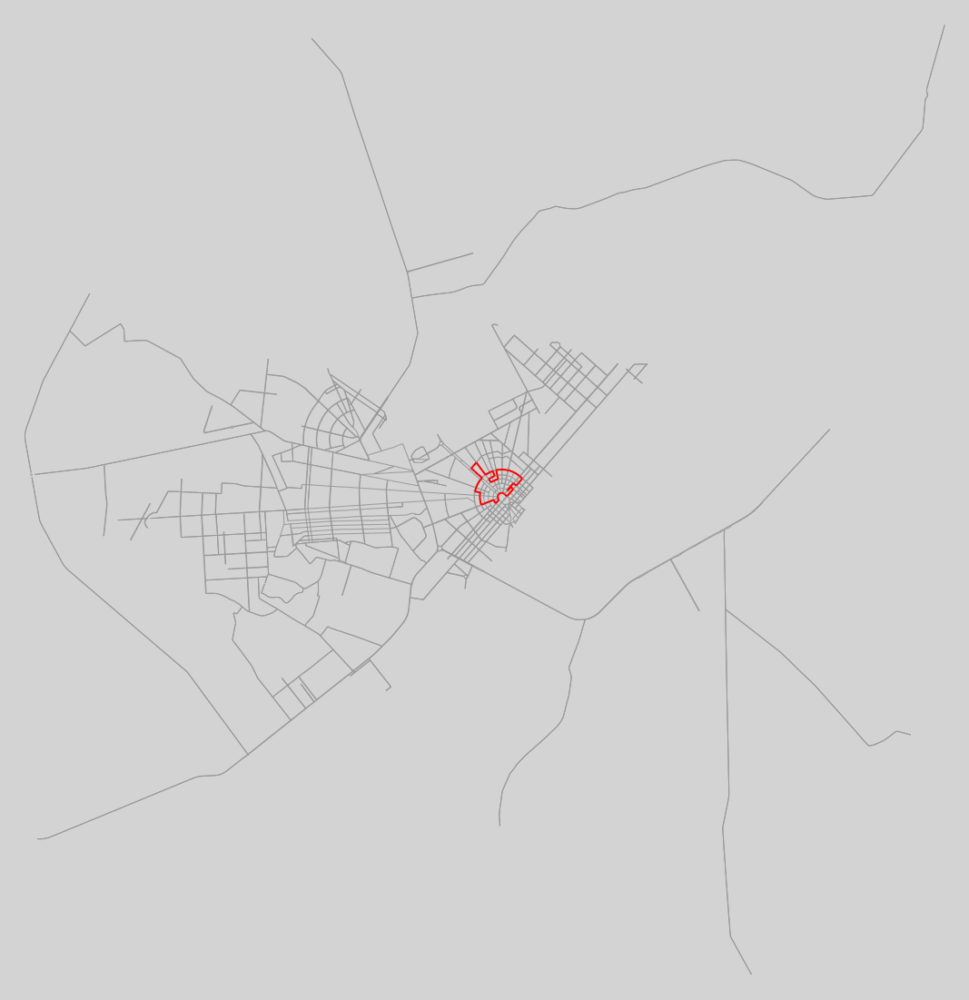



Rota 32 - 88 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Terêncio Lima
Avenida Capitão Ene Garcês
Avenida Forte São Joaquim
Rua Major Manoel Correia
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Avenida Nossa Senhora da Consolata
Rua Coronel Pinto
Rua Alfredo Cruz
20ª - Avenida Amazonas





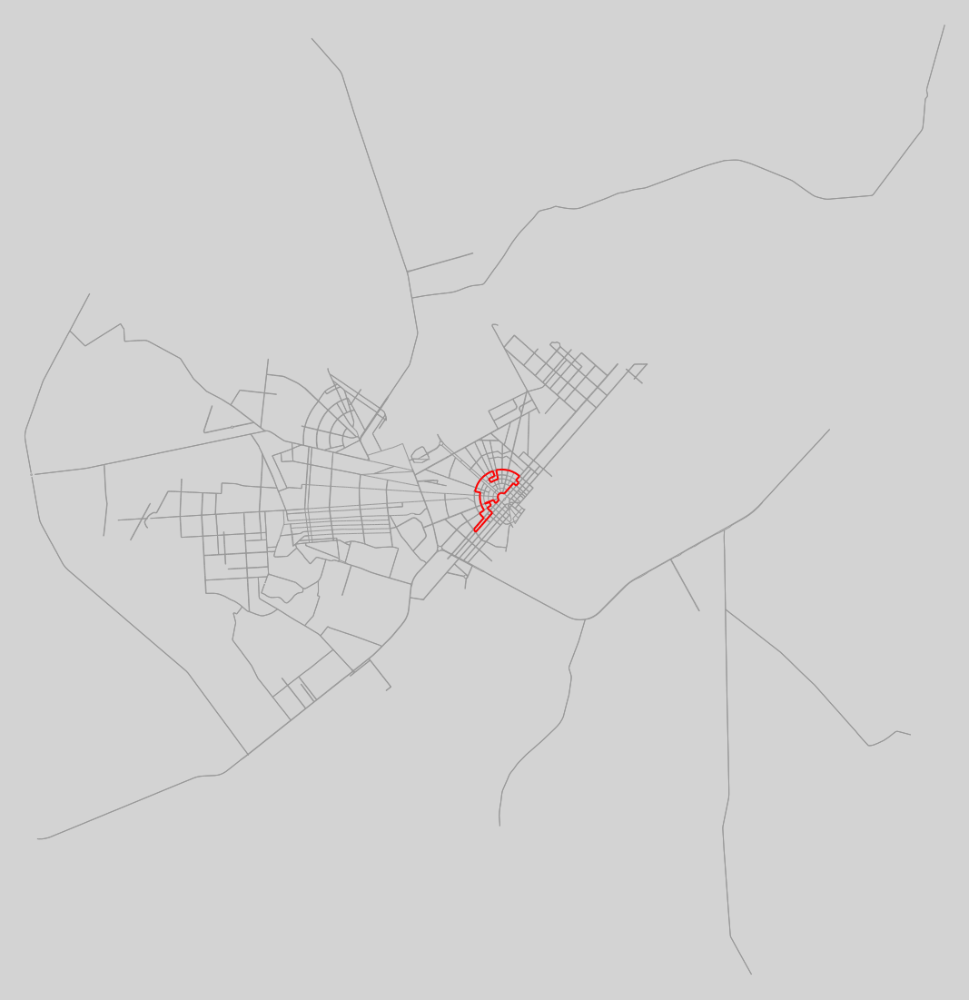



Rota 33 - 92 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Ajuricaba
Rua Cecília Brasil
Rua Professor Diomedes Souto Maior
Avenida Nossa Senhora da Consolata
Avenida Presidente Castelo Branco
Unname
Avenida Terêncio Lima
Rua Cerejo Cruz
Rua Dom Pedro I
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Major Manoel Correia
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
20ª - Avenida Amazonas





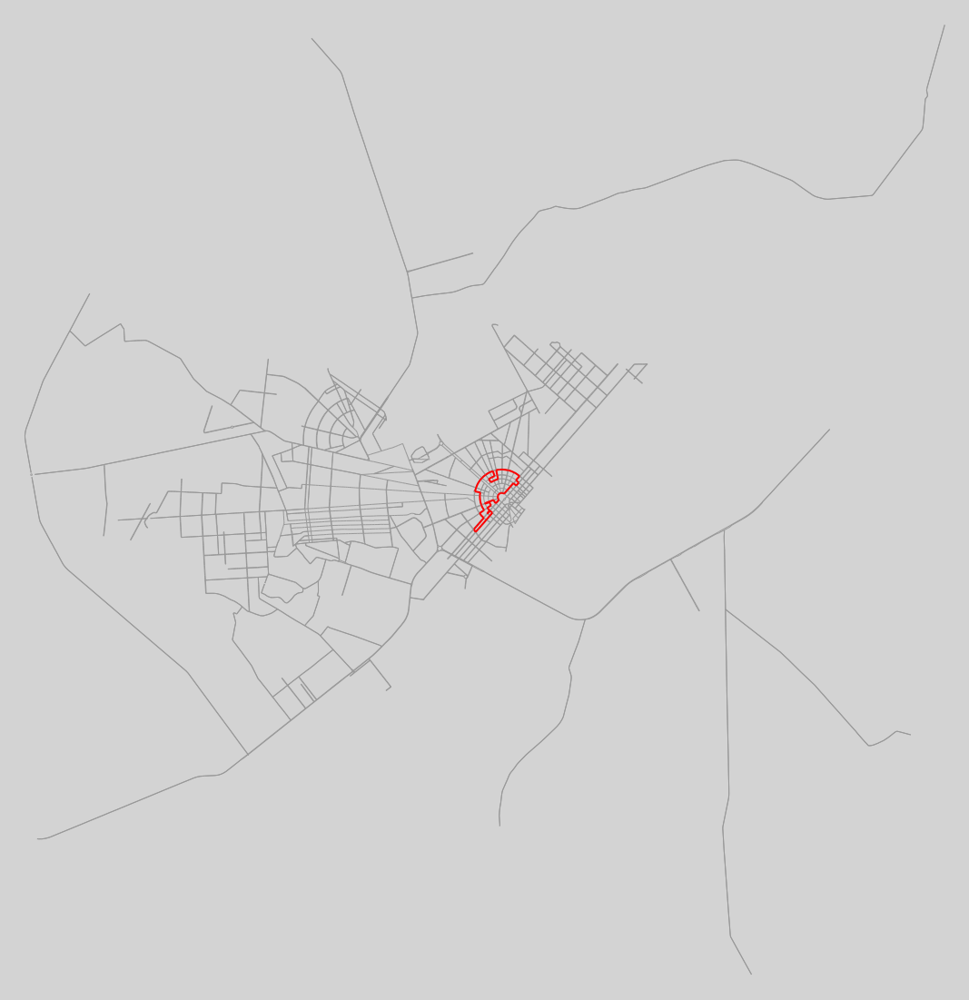



Rota 34 - 94 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Ajuricaba
Rua Cecília Brasil
Rua Professor Diomedes Souto Maior
Rua Cerejo Cruz
Avenida Nossa Senhora da Consolata
Avenida Presidente Castelo Branco
Unname
Avenida Terêncio Lima
Rua Dom Pedro I
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Major Manoel Correia
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
20ª - Avenida Amazonas





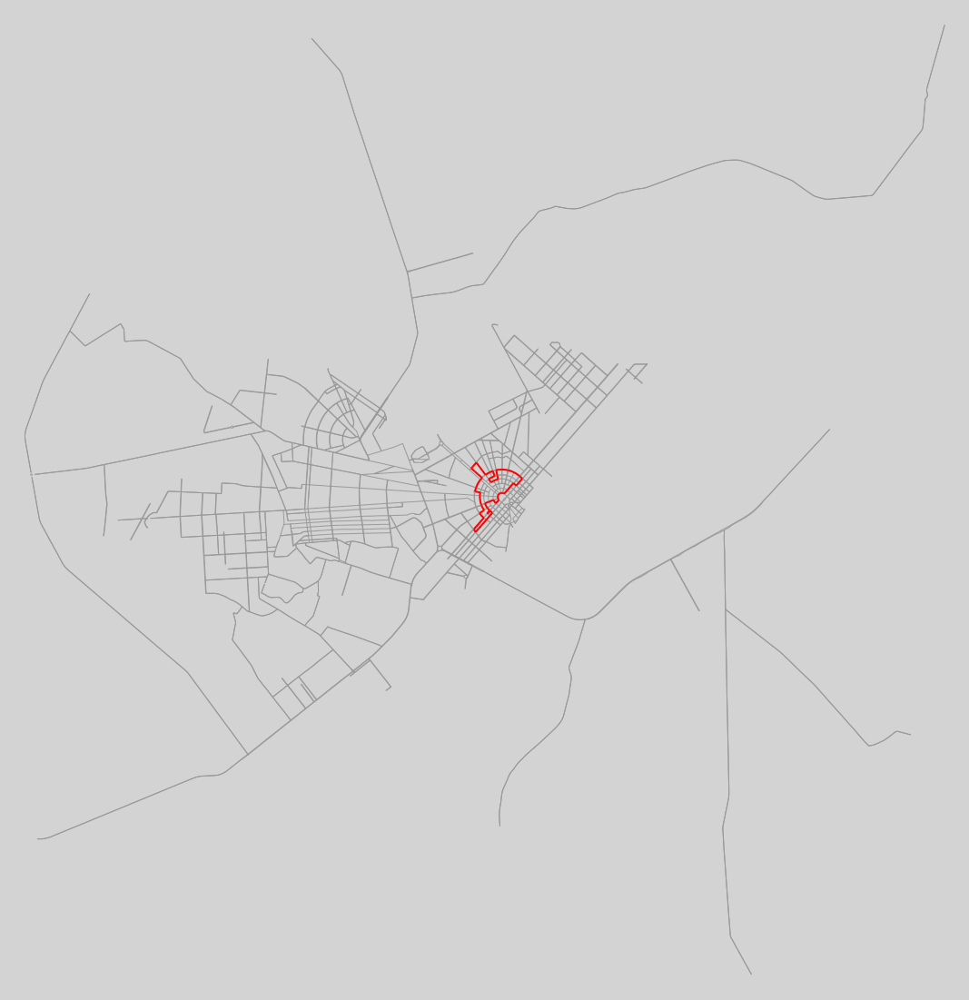



Rota 35 - 107 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Ajuricaba
Rua Cerejo Cruz
Avenida Nossa Senhora da Consolata
Avenida Presidente Castelo Branco
Unname
Avenida Terêncio Lima
Rua Professor Diomedes Souto Maior
Rua Dom Pedro I
Avenida Capitão Ene Garcês
Avenida Forte São Joaquim
Rua Major Manoel Correia
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
22ª - Avenida Amazonas





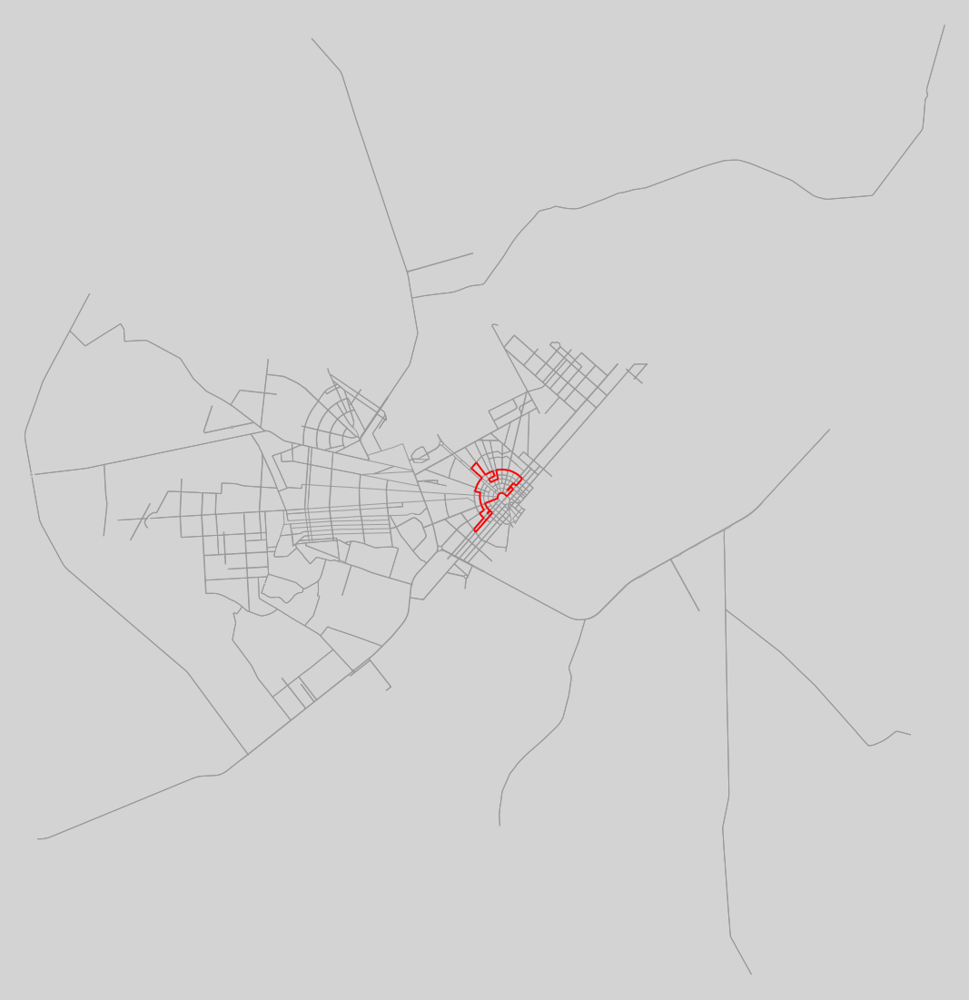



Rota 36 - 109 Arestas:

Avenida Amazonas
Avenida Glaycon de Paiva
Rua Ajuricaba
Avenida Ville Roy
Rua Cerejo Cruz
Avenida Nossa Senhora da Consolata
Avenida Presidente Castelo Branco
Unname
Avenida Terêncio Lima
Rua Professor Diomedes Souto Maior
Rua Dom Pedro I
Avenida Capitão Ene Garcês
Avenida Forte São Joaquim
Rua Major Manoel Correia
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Rua Coronel Pinto
Rua Alfredo Cruz
23ª - Avenida Amazonas





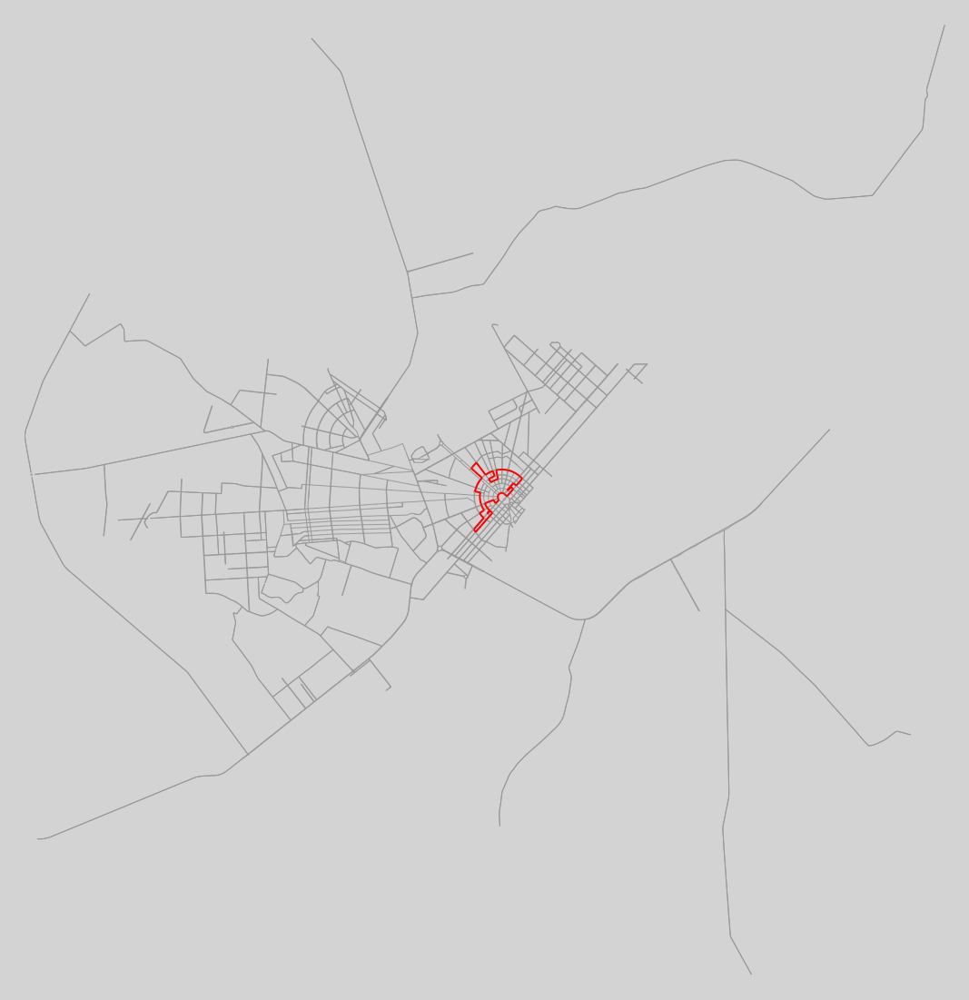



Rota 37 - 114 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Ajuricaba
Rua Cerejo Cruz
Avenida Nossa Senhora da Consolata
Avenida Presidente Castelo Branco
Unname
Avenida Terêncio Lima
Rua Professor Diomedes Souto Maior
Rua Dom Pedro I
Avenida Capitão Ene Garcês
Avenida Forte São Joaquim
Rua Major Manoel Correia
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Rua Coronel Pinto
Rua Alfredo Cruz
24ª - Avenida Amazonas





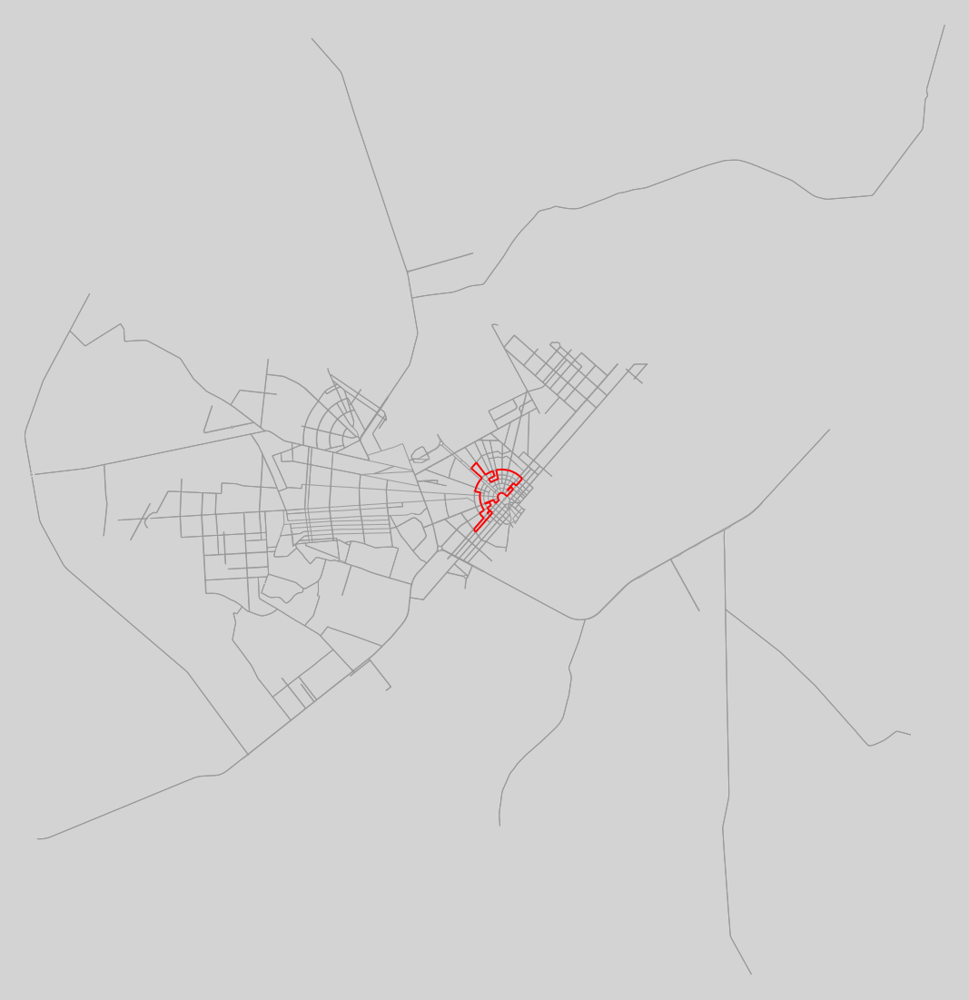



Rota 38 - 115 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Ajuricaba
Rua Cecília Brasil
Rua Professor Diomedes Souto Maior
Rua Cerejo Cruz
Avenida Nossa Senhora da Consolata
Avenida Presidente Castelo Branco
Unname
Avenida Terêncio Lima
Rua Dom Pedro I
Avenida Capitão Ene Garcês
Avenida Forte São Joaquim
Rua Major Manoel Correia
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Rua Coronel Pinto
Rua Alfredo Cruz
25ª - Avenida Amazonas





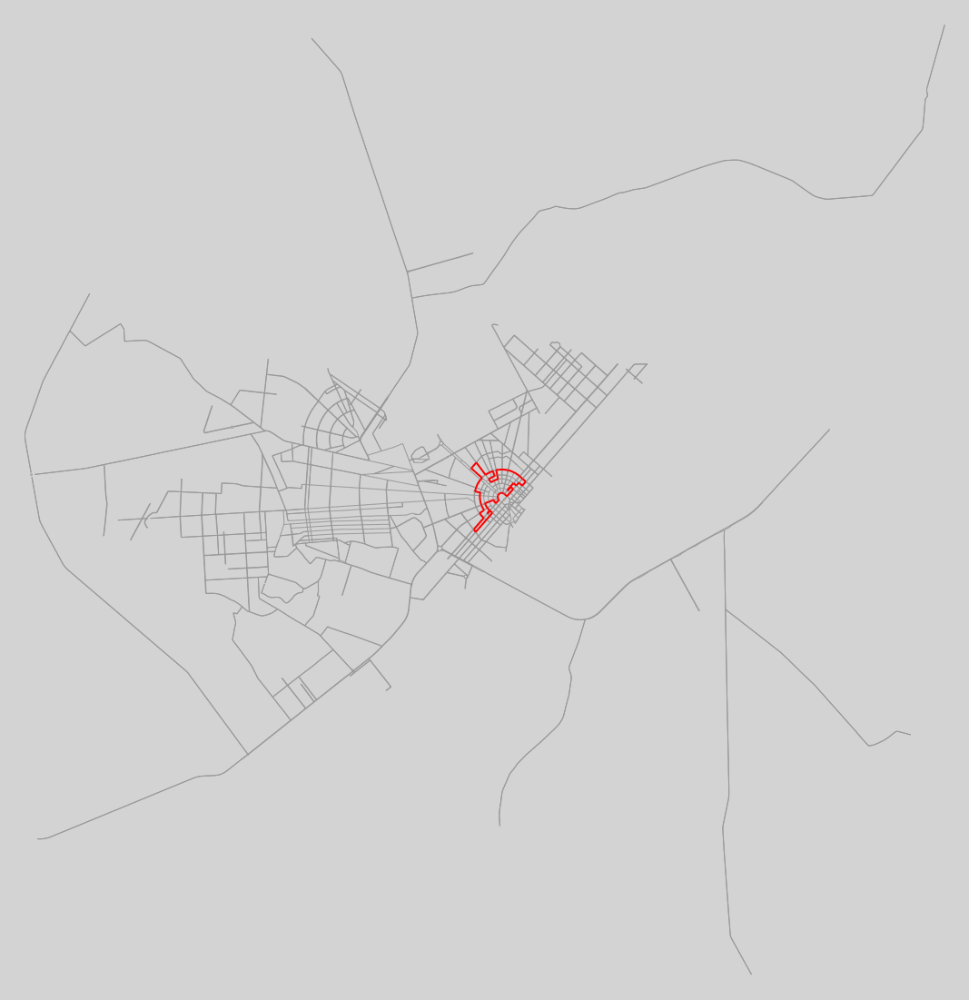



Rota 39 - 119 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Ajuricaba
Rua Cerejo Cruz
Avenida Nossa Senhora da Consolata
Avenida Presidente Castelo Branco
Unname
Avenida Terêncio Lima
Rua Professor Diomedes Souto Maior
Rua Dom Pedro I
Avenida Capitão Ene Garcês
Avenida Forte São Joaquim
Rua Major Manoel Correia
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Unname
Unname
Unname
Avenida Benjamin Constant
Rua Coronel Pinto
Rua Alfredo Cruz
28ª - Avenida Amazonas





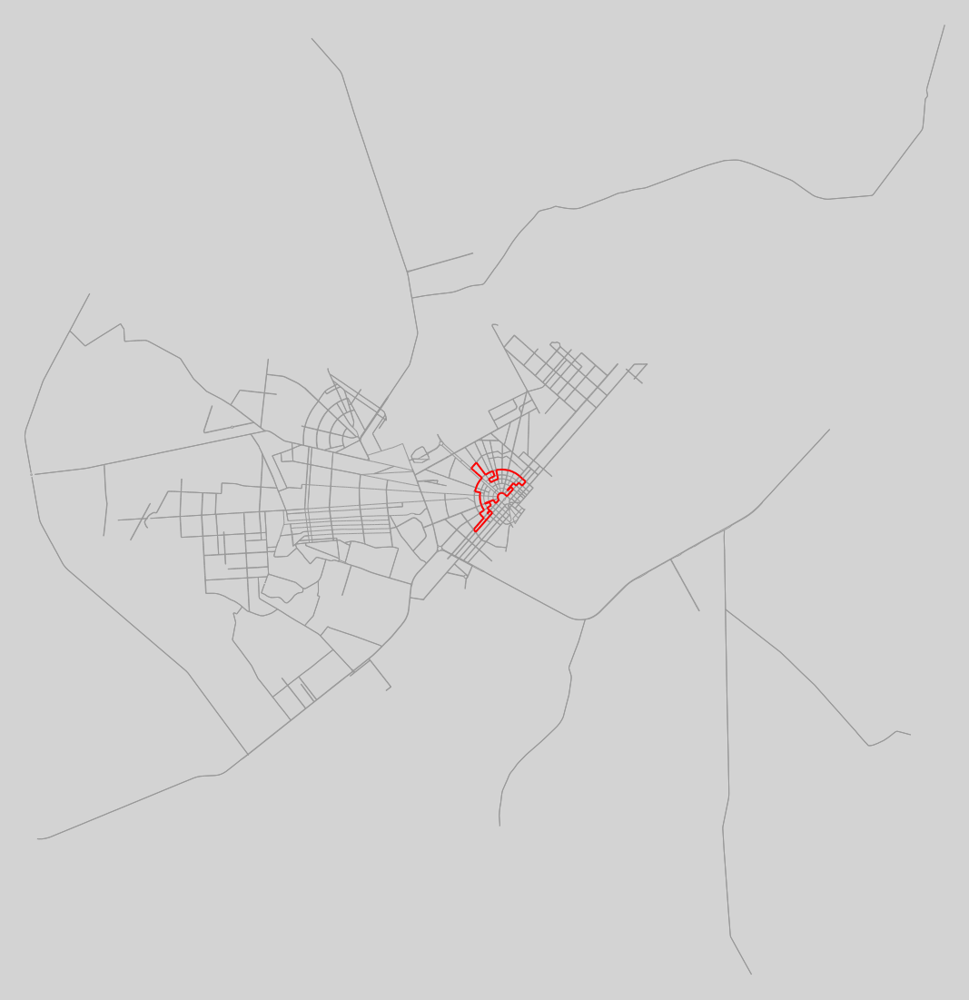



Rota 40 - 120 Arestas:

Avenida Amazonas
Avenida Ville Roy
Rua Araújo Filho
Avenida Glaycon de Paiva
Rua Ajuricaba
Rua Cecília Brasil
Rua Professor Diomedes Souto Maior
Rua Cerejo Cruz
Avenida Nossa Senhora da Consolata
Avenida Presidente Castelo Branco
Unname
Avenida Terêncio Lima
Rua Dom Pedro I
Avenida Capitão Ene Garcês
Avenida Forte São Joaquim
Rua Major Manoel Correia
Avenida Major Williams
Rua Valério Magalhães
Rua Coronel Mota
Rua Barão do Rio Branco
Rua Professor Agnelo Bitencourt
Unname
Unname
Unname
Unname
Avenida Benjamin Constant
Rua Coronel Pinto
Rua Alfredo Cruz
29ª - Avenida Amazonas





In [67]:
removerNodosFinal = []
contador = 1
if len(listaResultadoDFS) > 0:
    for cadaCicloEncontrado in range(len(listaResultadoDFS)):
                
        
        name = "3-Rota-"+ str(contador)

        arestas_sel = listaResultadoDFS[cadaCicloEncontrado]

        path = [ (u,v) for (u,v, attr) in G.edges(data=True) if (u,v) in arestas_sel]

        ox.plot.plot_graph_routes(G, path, show=True, fig_height=fig_height, fig_width=fig_width, bgcolor=bgcolor, route_alpha=1, route_linewidth=2, node_size=0 , orig_dest_node_alpha=0, filename=name, save=True,  file_format=formato_imgs )
        print("\n")

        printRotaRuas( contador, PlotMaioresCiclos[contador] , listaResultadoDFS[cadaCicloEncontrado] )
        contador = contador + 1
        
else:
    print("Infelizmente não foi possivel encontrar uma rota....")

 <h1 style="text-align: center;"> FIMMM --- Obrigado </h1>